# Predicting US Working Visa Applications

In [1]:
#Import the required packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import itertools
from bs4 import BeautifulSoup
import urllib.request
import re
from patsy import dmatrices
from sklearn.cross_validation import train_test_split
from sklearn import metrics
from sklearn.cross_validation import cross_val_score
from sklearn.tree import export_graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
%matplotlib inline
%config IPCompleter.greedy=True

#Display all columns in tables which were being left out before
#https://stackoverflow.com/questions/11707586/python-pandas-how-to-widen-output-display-to-see-more-columns
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 154 )

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
new_df_clean1 = pd.read_csv("US-Perm-Visa-PlottedFeaturesUnbalanced.csv")

In [3]:
new_df_clean1.select_dtypes(['object']).describe().T

,count,unique,top,freq
case_status,153625,2,Certified,139312
country_of_citizenship,142347,180,INDIA,92961
decision_date,153625,1176,2015-09-18,883
employer_address_1,153624,31576,211 QUALITY CIRCLE,5243
employer_city,153625,5017,NEW YORK,7753
employer_name,153625,32101,COGNIZANT TECHNOLOGY SOLUTIONS US CORPORATION,5248
employer_postal_code,153613,10559,77845,5249
employer_state,153613,53,CALIFORNIA,38389
pw_level_9089,141428,4,Level II,52185
pw_soc_code,153593,789,15-1132,53322


We'll first take a look at the variables with high cardinalities and their associated values.

In [4]:
country = new_df_clean1.groupby('country_of_citizenship').size().reset_index()
country.sort_values(0, ascending=False)

,country_of_citizenship,0
70,INDIA,92961
33,CHINA,11147
31,CANADA,4622
144,SOUTH KOREA,3057
127,PHILIPPINES,2865
104,MEXICO,1867
169,UNITED KINGDOM,1561
156,TAIWAN,1447
120,PAKISTAN,1348
112,NEPAL,1208


In [5]:
employer = new_df_clean1.groupby('employer_name').size().reset_index()
employer.sort_values(0, ascending=False)

,employer_name,0
6055,COGNIZANT TECHNOLOGY SOLUTIONS US CORPORATION,5248
14209,INTEL CORPORATION,2816
11705,GOOGLE INC.,2394
18199,MICROSOFT CORPORATION,1832
1371,AMAZON CORPORATE LLC,1493
1932,APPLE INC.,1355
20770,"ORACLE AMERICA, INC.",1273
13946,INFOSYS LTD.,1128
7781,DELOITTE CONSULTING LLP,864
5752,"CISCO SYSTEMS, INC.",814


In [6]:
state = new_df_clean1.groupby('employer_state').size().reset_index()
state.sort_values(0, ascending=False)

,employer_state,0
5,CALIFORNIA,38389
45,TEXAS,18362
31,NEW JERSEY,13432
33,NEW YORK,11943
14,ILLINOIS,7400
22,MASSACHUSETTS,6070
49,WASHINGTON,5574
23,MICHIGAN,5554
39,PENNSYLVANIA,5113
48,VIRGINIA,4736


In [7]:
pw_soc = new_df_clean1.groupby('pw_soc_title').size().reset_index()
pw_soc.sort_values(0, ascending=False)

,pw_soc_title,0
481,"Software Developers, Applications",53310
120,Computer Systems Analysts,16223
484,"Software Developers, Systems Software",9641
182,"Electronics Engineers, Except Computer",5652
127,Computer and Information Systems Managers,4119
113,"Computer Software Engineers, Applications",3415
378,Network and Computer Systems Administrators*,2541
1,Accountants and Auditors,2403
341,Mechanical Engineers,2328
295,"Internists, General",2232


In [8]:
new_df_clean1.head(20)

,case_status,country_of_citizenship,decision_date,employer_address_1,employer_city,employer_name,employer_postal_code,employer_state,pw_level_9089,pw_soc_code,pw_soc_title,pw_source_name_9089,pw_unit_of_pay_9089,wage_offer_unit_of_pay_9089,case_status_code
0,Certified,INDIA,2014-08-26,2447 NE152ND AVE,REDMOND,GREENBAY INFOTECH LLC,98052,WASHINGTON,Level II,15-1132,"Software Developers, Applications",OES,Year,NaN,1
1,Certified,INDIA,2016-04-29,"4211, PLEASANT VALLEY ROAD",CHANTILLY,TANVI IT SOLUTIONS INC,20151,VIRGINIA,Level III,15-1132,"Software Developers, Applications",OES,Year,Year,1
2,Certified,COLOMBIA,2016-07-08,3231 SE 6TH STREET,TOPEKA,PAYLESS SHOESOURCE,66023,KANSAS,Level I,11-3071,"Transportation, Storage, and Distribution Mana...",OES,Year,Year,1
3,Certified,INDIA,2013-08-30,"12337 JONES ROAD,",HOUSTON,"SAI BUSINESS SOLUTIONS, LLC.",77070,TEXAS,Level IV,15-1132,"Software Developers, Applications",OES,Year,NaN,1
4,Certified,CANADA,2016-06-22,402 BOUCKE BUILDING,UNIVERSITY PARK,THE PENNSYLVANIA STATE UNIVERSITY,16802,PENNSYLVANIA,Level I,25-1064,"Geography Teachers, Postsecondary",OES,Year,Year,1
5,Certified,INDIA,2016-06-23,3307 HILLVIEW AVENUE,PALO ALTO,TIBCO SOFTWARE INC.,94304,CALIFORNIA,Level II,15-1132,"Software Developers, Applications",OES,Year,Year,1
6,Certified,TAIWAN,2013-04-18,1250 W. WISCONSIN AVENUE,MILWAUKEE,MARQUETTE UNIVERSITY,53233,WISCONSIN,Level III,29-1029,"Dentists, All Other Specialists",OES,Year,NaN,1
7,Certified,INDIA,2013-05-30,717 NORTH HARWOOD STREET,DALLAS,KPMG LLP,75201,TEXAS,Level IV,15-1141,Database Administrators,OES,Year,NaN,1
8,Certified,INDIA,2016-11-14,500 PLAZA DRIVE,SECAUCUS,"THE CHILDREN'S PLACE SERVICES COMPANY, LLC",07094,NEW JERSEY,Level II,15-1121,Computer Systems Analysts,OES,Year,Year,1
9,Certified,CHINA,2016-09-02,1762 AUTOMATION PARKWAY,SAN JOSE,"HERMES MICROVISION, INC.",95131,CALIFORNIA,Level II,15-1133,"Software Developers, Systems Software",OES,Year,Year,1


## Discussion
Firstly, to deal with country_of_citizenship, we decided to find a meaningful way of grouping countries, that would render itself appropriate for modelling later on. We considered grouping by continent but we felt that this was not appropriate as this kind of grouping does not take into account factors like the socio-economic status of the country, and it's relationship with the US. We decided to try and group countries in two ways and investigate which might have more predictive power. Firstly, we decided on obtaining the GDP for each country in US dollars (as categorized by the International Monetary Fund(IMF)) and creating a new column with this values. We could then group countries by GDP and us this as a means of categorizing countries in socio-economic terms. Also GDP would provide us with a continuous feature which we could also plot against case status. We considered capturing a country's relationship with the US or the way the US perceives said countries. To measure this in a meaningful and sensible way, we used the US government's travel advisory webpage, which offers one of four categories of advice (Exercise normal precautions, exercise increased caution, reconsider travel, or do not travel) for each country. We decided to use this to additionally group countries and resolve our high cardinality issue.

We scraped the GDP information from wikipedia, created a dataframe with values from this source and then merged the dataframe to add the new columns to the original dataframe for GDP.

In [9]:
# https://www.analyticsvidhya.com/blog/2015/10/beginner-guide-web-scraping-beautiful-soup-python/
url =('https://en.wikipedia.org/wiki/List_of_countries_by_GDP_(nominal)_per_capita')
gdp = urllib.request.urlopen(url)

In [10]:
soup = BeautifulSoup(gdp)
soup.prettify()

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/bs4/__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html5lib"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 193 of the file /Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup(YOUR_MARKUP})

to this:

 BeautifulSoup(YOUR_MARKUP, "html5lib")

  markup_type=markup_type))


'<!DOCTYPE html>\n<html class="client-nojs" dir="ltr" lang="en">\n <head>\n  <meta charset="utf-8"/>\n  <title>\n   List of countries by GDP (nominal) per capita - Wikipedia\n  </title>\n  <script>\n   document.documentElement.className = document.documentElement.className.replace( /(^|\\s)client-nojs(\\s|$)/, "$1client-js$2" );\n  </script>\n  <script>\n   (window.RLQ=window.RLQ||[]).push(function(){mw.config.set({"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":false,"wgNamespaceNumber":0,"wgPageName":"List_of_countries_by_GDP_(nominal)_per_capita","wgTitle":"List of countries by GDP (nominal) per capita","wgCurRevisionId":838658647,"wgRevisionId":838658647,"wgArticleId":1050736,"wgIsArticle":true,"wgIsRedirect":false,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Wikipedia pending changes protected pages","Lists of countries by GDP per capita"],"wgBreakFrames":false,"wgPageContentLanguage":"en","wgPageContentModel":"wikitext","wgSeparatorTransformTab

In [11]:
tables=soup.find_all('table')

In [12]:
gdp_table=soup.find('table', class_='wikitable sortable')

In [13]:
print (gdp_table)

<table class="wikitable sortable" style="margin-left:auto;margin-right:auto;text-align: right">
<tbody><tr>
<th data-sort-type="number">Rank</th>
<th>Country</th>
<th><a href="/wiki/United_States_dollar" title="United States dollar">US$</a></th>
</tr>
<tr>
<td>1</td>
<td align="left"><span class="flagicon"><img alt="" class="thumbborder" data-file-height="600" data-file-width="1000" height="14" src="//upload.wikimedia.org/wikipedia/commons/thumb/d/da/Flag_of_Luxembourg.svg/23px-Flag_of_Luxembourg.svg.png" srcset="//upload.wikimedia.org/wikipedia/commons/thumb/d/da/Flag_of_Luxembourg.svg/35px-Flag_of_Luxembourg.svg.png 1.5x, //upload.wikimedia.org/wikipedia/commons/thumb/d/da/Flag_of_Luxembourg.svg/46px-Flag_of_Luxembourg.svg.png 2x" width="23"/> </span><a href="/wiki/Luxembourg" title="Luxembourg">Luxembourg</a></td>
<td>105,803</td>
</tr>
<tr>
<td>2</td>
<td align="left"><span class="flagicon"><img alt="" class="thumbborder" data-file-height="1000" data-file-width="1000" height="16" s

In [14]:
rank=[]
country=[]
gdp=[]

for row in gdp_table.findAll("tr"):
    cells = row.findAll('td')
    links = row.findAll('a')
 
    if len(cells)==3: 
        rank.append(cells[0].find(text=True))
        country.append(links[0].find(text=True))
        gdp.append(cells[2].find(text=True))

In [15]:
gdp_df=pd.DataFrame(columns=['Number'])

gdp_df['Rank']=rank
gdp_df['country']=country
gdp_df['GDP']=gdp
gdp_df['country_of_citizenship'] = gdp_df['country'].str.upper()
gdp_df1 = gdp_df.drop(['Number', 'country'], axis=1)

In [16]:
gdp_df1

,Rank,GDP,country_of_citizenship
0,1,"105,803",LUXEMBOURG
1,2,"80,591",SWITZERLAND
2,—,"77,451",MACAU
3,3,"74,941",NORWAY
4,4,"70,638",IRELAND
5,5,"70,332",ICELAND
6,6,"60,804",QATAR
7,7,"59,501",UNITED STATES
8,8,"57,713",SINGAPORE
9,9,"56,444",DENMARK


In [17]:
#http://chris.friedline.net/2015-12-15-rutgers/lessons/python2/04-merging-data.html
merged_gdp = pd.merge(left=new_df_clean1,right=gdp_df1, how='left', left_on='country_of_citizenship', right_on='country_of_citizenship')

In [18]:
merged_gdp.head(10)

,case_status,country_of_citizenship,decision_date,employer_address_1,employer_city,employer_name,employer_postal_code,employer_state,pw_level_9089,pw_soc_code,pw_soc_title,pw_source_name_9089,pw_unit_of_pay_9089,wage_offer_unit_of_pay_9089,case_status_code,Rank,GDP
0,Certified,INDIA,2014-08-26,2447 NE152ND AVE,REDMOND,GREENBAY INFOTECH LLC,98052,WASHINGTON,Level II,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,"1,983"
1,Certified,INDIA,2016-04-29,"4211, PLEASANT VALLEY ROAD",CHANTILLY,TANVI IT SOLUTIONS INC,20151,VIRGINIA,Level III,15-1132,"Software Developers, Applications",OES,Year,Year,1,139,"1,983"
2,Certified,COLOMBIA,2016-07-08,3231 SE 6TH STREET,TOPEKA,PAYLESS SHOESOURCE,66023,KANSAS,Level I,11-3071,"Transportation, Storage, and Distribution Mana...",OES,Year,Year,1,84,"6,273"
3,Certified,INDIA,2013-08-30,"12337 JONES ROAD,",HOUSTON,"SAI BUSINESS SOLUTIONS, LLC.",77070,TEXAS,Level IV,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,"1,983"
4,Certified,CANADA,2016-06-22,402 BOUCKE BUILDING,UNIVERSITY PARK,THE PENNSYLVANIA STATE UNIVERSITY,16802,PENNSYLVANIA,Level I,25-1064,"Geography Teachers, Postsecondary",OES,Year,Year,1,16,"45,077"
5,Certified,INDIA,2016-06-23,3307 HILLVIEW AVENUE,PALO ALTO,TIBCO SOFTWARE INC.,94304,CALIFORNIA,Level II,15-1132,"Software Developers, Applications",OES,Year,Year,1,139,"1,983"
6,Certified,TAIWAN,2013-04-18,1250 W. WISCONSIN AVENUE,MILWAUKEE,MARQUETTE UNIVERSITY,53233,WISCONSIN,Level III,29-1029,"Dentists, All Other Specialists",OES,Year,NaN,1,—,"24,577"
7,Certified,INDIA,2013-05-30,717 NORTH HARWOOD STREET,DALLAS,KPMG LLP,75201,TEXAS,Level IV,15-1141,Database Administrators,OES,Year,NaN,1,139,"1,983"
8,Certified,INDIA,2016-11-14,500 PLAZA DRIVE,SECAUCUS,"THE CHILDREN'S PLACE SERVICES COMPANY, LLC",07094,NEW JERSEY,Level II,15-1121,Computer Systems Analysts,OES,Year,Year,1,139,"1,983"
9,Certified,CHINA,2016-09-02,1762 AUTOMATION PARKWAY,SAN JOSE,"HERMES MICROVISION, INC.",95131,CALIFORNIA,Level II,15-1133,"Software Developers, Systems Software",OES,Year,Year,1,71,"8,643"


In [19]:
# Must change GDP to numerical value
merged_gdp['GDP'] = merged_gdp.GDP.str.replace(',', '').astype(float, errors='ignore')

In [20]:
merged_gdp.dtypes

case_status                     object
country_of_citizenship          object
decision_date                   object
employer_address_1              object
employer_city                   object
employer_name                   object
employer_postal_code            object
employer_state                  object
pw_level_9089                   object
pw_soc_code                     object
pw_soc_title                    object
pw_source_name_9089             object
pw_unit_of_pay_9089             object
wage_offer_unit_of_pay_9089     object
case_status_code                 int64
Rank                            object
GDP                            float64
dtype: object

Now we will group countries into low, medium and high categories, based on their GDP.

In [21]:
merged_gdp['GDP'].describe().T

count    141815.000000
mean       7620.091887
std       12569.520346
min         228.000000
25%        1983.000000
50%        1983.000000
75%        8064.000000
max      105803.000000
Name: GDP, dtype: float64

In [22]:
#Creating bins based on descriptive statistics
bins = [0, 1983, 8643, 105803]

groupNames = ['Low Rank GDP', 'Mid Rank GDP', 'High Rank GDP']
array = merged_gdp['GDP']
merged_gdp['GDPGroups']= pd.cut(array, bins=bins, labels=groupNames)

Next, we turned to categorizing countries according to travel advice issued by the US government. 

In [23]:
# https://www.analyticsvidhya.com/blog/2015/10/beginner-guide-web-scraping-beautiful-soup-python/
url =('https://travel.state.gov/content/travel/en/traveladvisories/traveladvisories.html')
travel_advice = urllib.request.urlopen(url)

In [24]:
soup = BeautifulSoup(travel_advice)
soup.prettify()

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/bs4/__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html5lib"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 193 of the file /Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup(YOUR_MARKUP})

to this:

 BeautifulSoup(YOUR_MARKUP, "html5lib")

  markup_type=markup_type))


'<!-- START CAPTCHA -->\n<html>\n <head>\n  <script async="" defer="" src="//www.google.com/recaptcha/api.js?onload=onloadCallback&amp;render=explicit" type="text/javascript">\n  </script>\n  <script type="text/javascript">\n   var onloadCallback = function() {\n           \tif ($(\'#captchaImage\').length) { \n               \t\tgrecaptcha.render(\'captchaImage\', {\n               \t\t\t\'sitekey\' : \'6Ld0yEcUAAAAAHz2KIeCdmJjT01qzGKXBpexp_ke\'\n               \t\t});\n                }\n     \t\t};\n  </script>\n  <!-- END CAPTCHA -->\n  <meta content="width=device-width, initial-scale=1.0, maximum-scale=1.0, user-scalable=no" name="viewport"/>\n  <title>\n   Travel Advisories\n  </title>\n  <link href="/apps/tsg-rwd/components/content/tsg-rwd-top-sitewide-resource-menu/clientlib/css/tsg-rwd-top-sitewide-resource-menu.css" rel="stylesheet"/>\n  <link href="/apps/tsg-rwd/components/content/resources/favicon.ico" rel="shortcut icon" type="image/x-icon"/>\n  <meta content="/content/dam

In [25]:
div = soup.find('div', {'class': 'table-data simple_richtextarea'})

In [26]:
print (div)

<div class="table-data simple_richtextarea">


<table border="0" cellpadding="0" cellspacing="0">
<tbody><tr><td><b>Advisory</b></td>
<td><b>Level </b></td>
<td><b>Date updated</b></td>
</tr><tr><td valign="bottom"><p><a href="/content/travel/en/traveladvisories/traveladvisories/afghanistan-advisory.html">Afghanistan</a></p>
</td>
<td><p>4: Do not travel</p>
</td>
<td><p>2018-01-10</p>
</td>
</tr><tr><td valign="bottom"><p><a href="/content/travel/en/traveladvisories/traveladvisories/albania-travel-advisory.html">Albania</a></p>
</td>
<td valign="bottom"><p>1: Exercise normal precautions</p>
</td>
<td><p>2018-01-10</p>
</td>
</tr><tr><td valign="bottom"><p><a href="/content/travel/en/traveladvisories/traveladvisories/algeria-travel-advisory.html">Algeria</a></p>
</td>
<td><p>2: Exercise increased caution</p>
</td>
<td><p>2018-01-10</p>
</td>
</tr><tr><td valign="bottom"><p><a href="/content/travel/en/traveladvisories/traveladvisories/andorra-travel-advisory.html">Andorra</a></p>
</td>


In [27]:
country=[]
advice=[]
advice1=[]

for row in div.findAll("tr"):
    cells = row.findAll('td')
 
    if len(cells)==3: 
        country.append(cells[0].find(text=True))
        advice.append(cells[1].find(text=True))
        advice1.append(cells[2].find(text=True))

In [28]:
travel=pd.DataFrame(columns=['Number'])

travel['country']=country
travel['advice']=advice
travel['country'] = travel['country'].str.upper()
travel_advice = travel.drop(['Number'], axis=1)

In [29]:
#http://chris.friedline.net/2015-12-15-rutgers/lessons/python2/04-merging-data.html
merged_ta = pd.merge(left=merged_gdp,right=travel_advice, how='left', left_on='country_of_citizenship', right_on='country')

In [30]:
t_advice = merged_ta.groupby('advice').size().reset_index()
t_advice.sort_values(0, ascending=False)

,advice,0
1,2: Exercise increased caution,118017
0,1: Exercise normal precautions,16648
2,3: Reconsider travel,4731
4,4: Do not travel,682
3,3: Reconsider travel,28


In [31]:
merged_left = merged_ta

In [32]:
merged_left.advice=merged_ta.advice.replace('3: Reconsider travel', '3:Reconsider travel')

In [33]:
merged_left.advice=merged_ta.advice.replace('3: Reconsider travel', '3:Reconsider travel')

<p>We then attempted to create new features out of the state category. We could see in the previous plot there were strong variations between certified and denied and wanted a cleaner way of representing this data. </p>
<p>To do this we grouped each state by how the state voted by in the last presidential election to see if there may be a difference between Democratic or Republican states.</p>
<p>To do this we used data scraping with Beautiful Soup, to get the information from a table that identified the state and how they voted. We used regular expression to get the name of the political party and then joined this with existing table.</p>

In [34]:
url =('https://en.wikipedia.org/wiki/Political_party_strength_in_U.S._states')
party = urllib.request.urlopen(url)

In [35]:
soup = BeautifulSoup(party)

soup.prettify()

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/bs4/__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html5lib"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 193 of the file /Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup(YOUR_MARKUP})

to this:

 BeautifulSoup(YOUR_MARKUP, "html5lib")

  markup_type=markup_type))


'<!DOCTYPE html>\n<html class="client-nojs" dir="ltr" lang="en">\n <head>\n  <meta charset="utf-8"/>\n  <title>\n   Political party strength in U.S. states - Wikipedia\n  </title>\n  <script>\n   document.documentElement.className = document.documentElement.className.replace( /(^|\\s)client-nojs(\\s|$)/, "$1client-js$2" );\n  </script>\n  <script>\n   (window.RLQ=window.RLQ||[]).push(function(){mw.config.set({"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":false,"wgNamespaceNumber":0,"wgPageName":"Political_party_strength_in_U.S._states","wgTitle":"Political party strength in U.S. states","wgCurRevisionId":838907561,"wgRevisionId":838907561,"wgArticleId":898541,"wgIsArticle":true,"wgIsRedirect":false,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Use mdy dates from December 2014","Articles containing potentially dated statements from October 2017","All articles containing potentially dated statements","Articles containing potentially dated statements f

In [36]:
tables=soup.find_all('table')

tables

[<table class="wikitable" style="margin: 1em auto 1em auto; text-align:center;">
 <caption>Partisan lean of U.S. states according to Gallup polling<sup class="reference" id="cite_ref-Gallup-2014-states_5-1"><a href="#cite_note-Gallup-2014-states-5">[5]</a></sup></caption>
 <tbody><tr>
 <th> </th>
 <th colspan="6">Number of U.S. States</th>
 </tr>
 <tr>
 <th width="16%">Year</th>
 <th width="14%">Solid Dem</th>
 <th width="14%">Lean Dem</th>
 <th width="14%">Competitive</th>
 <th width="14%">Lean GOP</th>
 <th width="14%">Solid GOP</th>
 <th width="14%">Net Dem</th>
 </tr>
 <tr>
 <td>2008</td>
 <td>29</td>
 <td>6</td>
 <td>10</td>
 <td>1</td>
 <td>4</td>
 <td>+30</td>
 </tr>
 <tr>
 <td>2009</td>
 <td>23</td>
 <td>10</td>
 <td>12</td>
 <td>1</td>
 <td>4</td>
 <td>+28</td>
 </tr>
 <tr>
 <td>2010</td>
 <td>13</td>
 <td>9</td>
 <td>18</td>
 <td>5</td>
 <td>5</td>
 <td>+12</td>
 </tr>
 <tr>
 <td>2011</td>
 <td>11</td>
 <td>7</td>
 <td>15</td>
 <td>7</td>
 <td>10</td>
 <td>+1</td>
 </tr>
 <tr

In [37]:
party_table=soup.find_all('table', class_='wikitable')[1]

print (party_table)

<table class="wikitable" width="100%">
<tbody><tr align="center">
<th width="11%">State</th>
<th width="12%">2016 Presidential<br/>
Election</th>
<th width="11%">Governor</th>
<th width="11%">State Senate</th>
<th width="11%">State House</th>
<th width="11%">Senior<br/>
U.S. Senator</th>
<th width="11%">Junior<br/>
U.S. Senator</th>
<th width="11%">U.S. House of Representatives</th>
<th width="11%">Partisan Split (as of 2014<sup class="plainlinks noexcerpt noprint asof-tag update" style="display:none;"><a class="external text" href="//en.wikipedia.org/w/index.php?title=Political_party_strength_in_U.S._states&amp;action=edit">[update]</a></sup>)</th>
</tr>
<tr align="center">
<td><a href="/wiki/Alabama" title="Alabama">Alabama</a></td>
<td style="background:#FFB6B6">Republican</td>
<td style="background:#FFB6B6">Republican</td>
<td style="background:#FFB6B6">Republican 26-7-1<sup>(a)</sup></td>
<td style="background:#FFB6B6">Republican 70-32</td>
<td style="background:#FFB6B6">Republica

In [38]:
state = []
party=[]
count=0
for row in party_table.findAll("tr"):
    cells = row.findAll('td')
    cells = str(cells[1:2])
    cells = cells.strip(']')
    cells = cells.strip('[')
    links = row.findAll('a')

    if count != 0:
        state_found = links[0].find(text=True)
        state.append(state_found.upper())
        
        m = re.search("(<td style=\"background:#)([A-Z\d]+)(\">)\W*([A-Z][a-z]+)(</td>)",cells)
        if m:
            party.append(m.group(4))
        
    else:
        count+=1

In [39]:
party_df=pd.DataFrame(columns=['Number'])

party_df['State']=state 
party_df['Party']=party

party_df = party_df.drop(['Number'], axis=1)

In [40]:
# #http://chris.friedline.net/2015-12-15-rutgers/lessons/python2/04-merging-data.html
merged_left = pd.merge(left=merged_left,right=party_df, how='left', left_on='employer_state', right_on='State')
merged_left =merged_left.drop('State', axis = 1)

<p>The next step was to try and group the job titles by their various industries. </p>
<p>This was done by examining the common job title names and taking common expressions that were unique to each industry, this was then checked against a regular expression compiler for each industry and grouped into the appropriate category. </p>

In [41]:
titles = merged_left['pw_soc_title'].values

In [42]:
industry = []
title = []

#grouping job titles into industry depednant on the content of the title
for word in titles:
    word = str(word)
    r = re.compile(r' Educat | Teacher | Instructional ', flags=re.I | re.X)
    if r.findall(word):
        industry.append('Education')
        title.append(word)
    else:
        r = re.compile(r' Software | Computer | \bDatabase\b | Web | Data | Graphic', flags=re.I | re.X) #(?<!Except ).
        if r.findall(word):
                industry.append('Technology')
                title.append(word)
        else:
            r = re.compile(r' Sale | Market | Advertising | Training | Relations | Purchasing ', flags=re.I | re.X)
            if r.findall(word):
                industry.append('Sales and Marketing')
                title.append(word)
            else:
                r = re.compile(r' Engineer | Operations | Architect | Construction |  Industrial | Estimators | logistic | Distribution', flags=re.I | re.X)  
                if r.findall(word):
                    industry.append('Construction and Engineering')
                    title.append(word)
                else:
                    r = re.compile(r' Health | Medic | Thera | Obstetrician | Dietit | Anesthes | General | Dentist | Podiat | Surgeon | Psychiatrists | Pharma | Speech | Vet', flags=re.I | re.X)
                    if r.findall(word):
                        industry.append('Health and Medicine')
                        title.append(word)
                    else:
                        r = re.compile(r' Scien | Bio | Chem | Lab | Geo | Phys | Math', flags=re.I | re.X)
                        if r.findall(word):
                            industry.append('Science')
                            title.append(word)
                        else:
                            r = re.compile(r' Finan | Insurance | Account |  Clerk | Econ | Treasurers | Audit | Statis | Compliance | Chief | Analyst | Actuaries', flags=re.I | re.X)
                            if r.findall(word):
                                industry.append('Accounting and Finance')
                                title.append(word)
                            else:
                                r = re.compile(r' Law | Legal ', flags=re.I | re.X)
                                if r.findall(word):
                                    industry.append('Law')
                                    title.append(word)
                                else:
                                    if word != 'nan':
                                        industry.append('Other')
                                        title.append(word)
                                    else:
                                        industry.append('Blank')
                                        title.append(word)


In [43]:
sector_df=pd.DataFrame(columns=['Number'])

sector_df['Industry']=industry
sector_df['pw_soc_title']=title
sector_df = sector_df.drop(['Number'], axis=1)
sector_df

,Industry,pw_soc_title
0,Technology,"Software Developers, Applications"
1,Technology,"Software Developers, Applications"
2,Construction and Engineering,"Transportation, Storage, and Distribution Mana..."
3,Technology,"Software Developers, Applications"
4,Education,"Geography Teachers, Postsecondary"
5,Technology,"Software Developers, Applications"
6,Health and Medicine,"Dentists, All Other Specialists"
7,Technology,Database Administrators
8,Technology,Computer Systems Analysts
9,Technology,"Software Developers, Systems Software"


In [44]:
merged = pd.merge(merged_left, sector_df, left_index=True, right_index=True)

merged_left = merged.drop(['pw_soc_title_y'], axis=1)

In [45]:
merged_left.head()

,case_status,country_of_citizenship,decision_date,employer_address_1,employer_city,employer_name,employer_postal_code,employer_state,pw_level_9089,pw_soc_code,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,wage_offer_unit_of_pay_9089,case_status_code,Rank,GDP,GDPGroups,country,advice,Party,Industry
0,Certified,INDIA,2014-08-26,2447 NE152ND AVE,REDMOND,GREENBAY INFOTECH LLC,98052,WASHINGTON,Level II,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology
1,Certified,INDIA,2016-04-29,"4211, PLEASANT VALLEY ROAD",CHANTILLY,TANVI IT SOLUTIONS INC,20151,VIRGINIA,Level III,15-1132,"Software Developers, Applications",OES,Year,Year,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology
2,Certified,COLOMBIA,2016-07-08,3231 SE 6TH STREET,TOPEKA,PAYLESS SHOESOURCE,66023,KANSAS,Level I,11-3071,"Transportation, Storage, and Distribution Mana...",OES,Year,Year,1,84,6273.0,Mid Rank GDP,COLOMBIA,2: Exercise increased caution,Republican,Construction and Engineering
3,Certified,INDIA,2013-08-30,"12337 JONES ROAD,",HOUSTON,"SAI BUSINESS SOLUTIONS, LLC.",77070,TEXAS,Level IV,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology
4,Certified,CANADA,2016-06-22,402 BOUCKE BUILDING,UNIVERSITY PARK,THE PENNSYLVANIA STATE UNIVERSITY,16802,PENNSYLVANIA,Level I,25-1064,"Geography Teachers, Postsecondary",OES,Year,Year,1,16,45077.0,High Rank GDP,CANADA,1: Exercise normal precautions,Republican,Education


<p>We could see in the original representation of the decision date that there were important features present and wanted to include this information in our model. </p>
<p>We decided to isolate the decision month and decision year to get a better understanding of the feature. </p>

In [46]:
merged_left.decision_date.value_counts()

2015-09-18    883
2015-08-28    833
2015-07-30    738
2015-09-01    691
2016-06-15    629
2016-08-22    570
2015-09-21    533
2016-09-21    518
2016-07-27    504
2016-07-08    504
2016-06-20    503
2016-06-13    492
2014-06-05    487
2016-10-19    482
2016-04-25    480
2016-05-11    479
2016-08-05    476
2016-08-26    470
2016-06-17    470
2016-09-20    468
2016-05-10    460
2014-05-06    456
2016-07-11    453
2016-04-21    451
2016-05-05    448
2016-10-17    446
2015-07-10    443
2016-05-19    439
2016-09-09    436
2016-07-15    436
2015-09-02    435
2016-04-27    435
2015-09-04    435
2016-04-22    433
2016-11-02    430
2016-06-10    424
2016-05-02    422
2016-06-27    421
2016-05-25    419
2016-05-06    418
2016-11-14    415
2016-10-31    415
2016-05-12    414
2016-06-24    414
2016-08-29    413
2016-10-26    412
2016-07-20    412
2016-04-18    411
2016-05-16    411
2014-06-04    409
2016-04-15    405
2016-07-28    401
2015-09-25    399
2014-05-20    398
2014-05-30    398
2016-06-16

In [47]:
# Changing to datetime type
merged_left['decision_date']=pd.to_datetime(merged_left['decision_date'], errors = 'coerce')

In [48]:
merged_left.dtypes

case_status                            object
country_of_citizenship                 object
decision_date                  datetime64[ns]
employer_address_1                     object
employer_city                          object
employer_name                          object
employer_postal_code                   object
employer_state                         object
pw_level_9089                          object
pw_soc_code                            object
pw_soc_title_x                         object
pw_source_name_9089                    object
pw_unit_of_pay_9089                    object
wage_offer_unit_of_pay_9089            object
case_status_code                        int64
Rank                                   object
GDP                                   float64
GDPGroups                            category
country                                object
advice                                 object
Party                                  object
Industry                          

In [49]:
merged_left.decision_date

0        2014-08-26
1        2016-04-29
2        2016-07-08
3        2013-08-30
4        2016-06-22
5        2016-06-23
6        2013-04-18
7        2013-05-30
8        2016-11-14
9        2016-09-02
10       2015-08-06
11       2014-06-26
12       2016-08-29
13       2015-08-06
14       2011-12-19
15       2014-04-07
16       2015-08-07
17       2015-08-24
18       2016-08-03
19       2016-10-07
20       2016-08-22
21       2014-05-14
22       2016-06-20
23       2016-04-27
24       2015-09-01
25       2016-04-19
26       2016-07-14
27       2015-08-04
28       2014-06-27
29       2013-05-06
30       2016-04-26
31       2012-02-07
32       2016-06-28
33       2014-07-09
34       2016-10-20
35       2016-06-20
36       2015-07-29
37       2013-09-27
38       2016-09-14
39       2016-07-28
40       2016-08-01
41       2014-06-02
42       2016-11-09
43       2016-07-13
44       2013-06-21
45       2016-09-23
46       2016-04-21
47       2016-06-17
48       2016-06-14
49       2013-06-05


In [50]:
merged_left['decision_Year'] = merged_left['decision_date'].dt.year
merged_left['decision_Month'] = merged_left['decision_date'].dt.month

In [51]:
merged_left.head()

,case_status,country_of_citizenship,decision_date,employer_address_1,employer_city,employer_name,employer_postal_code,employer_state,pw_level_9089,pw_soc_code,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,wage_offer_unit_of_pay_9089,case_status_code,Rank,GDP,GDPGroups,country,advice,Party,Industry,decision_Year,decision_Month
0,Certified,INDIA,2014-08-26,2447 NE152ND AVE,REDMOND,GREENBAY INFOTECH LLC,98052,WASHINGTON,Level II,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2014,8
1,Certified,INDIA,2016-04-29,"4211, PLEASANT VALLEY ROAD",CHANTILLY,TANVI IT SOLUTIONS INC,20151,VIRGINIA,Level III,15-1132,"Software Developers, Applications",OES,Year,Year,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2016,4
2,Certified,COLOMBIA,2016-07-08,3231 SE 6TH STREET,TOPEKA,PAYLESS SHOESOURCE,66023,KANSAS,Level I,11-3071,"Transportation, Storage, and Distribution Mana...",OES,Year,Year,1,84,6273.0,Mid Rank GDP,COLOMBIA,2: Exercise increased caution,Republican,Construction and Engineering,2016,7
3,Certified,INDIA,2013-08-30,"12337 JONES ROAD,",HOUSTON,"SAI BUSINESS SOLUTIONS, LLC.",77070,TEXAS,Level IV,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2013,8
4,Certified,CANADA,2016-06-22,402 BOUCKE BUILDING,UNIVERSITY PARK,THE PENNSYLVANIA STATE UNIVERSITY,16802,PENNSYLVANIA,Level I,25-1064,"Geography Teachers, Postsecondary",OES,Year,Year,1,16,45077.0,High Rank GDP,CANADA,1: Exercise normal precautions,Republican,Education,2016,6


<p>We then wanted to get a broader category for the states, we did this by grouping them into their census region. </p>

In [52]:
url =('http://www.nationsonline.org/oneworld/US-states-by-area.htm')
region = urllib.request.urlopen(url)

In [53]:
soup = BeautifulSoup(region)
soup.prettify()

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/bs4/__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html5lib"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 193 of the file /Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup(YOUR_MARKUP})

to this:

 BeautifulSoup(YOUR_MARKUP, "html5lib")

  markup_type=markup_type))


'<!DOCTYPE html>\n<html>\n <head>\n  <meta charset="utf-8"/>\n  <meta content="width=device-width, initial-scale=1" name="viewport"/>\n  <title>\n   List of US States by Area - Nations Online Project\n  </title>\n  <meta content="US states by area, largest US states, smallest US states by area, area of a state, list of US states by area, area, surface area, total area" name="keywords"/>\n  <meta content="From the largest to the smallest state of the United States. A list of all US States by total area in square kilometers and square miles." name="description"/>\n  <meta content="klaus kästle - nationsonline.org" name="author"/>\n  <meta content="index,follow" name="robots"/>\n  <meta content="99 days" name="revisit-after"/>\n  <meta content="http://www.nationsonline.org/oneworld/US-states-by-area.htm" property="og:url"/>\n  <meta content="website" property="og:type"/>\n  <meta content="List of US States by Area - Nations Online Project" property="og:title"/>\n  <meta content="From the 

In [54]:
tables=soup.find_all('table', 'statelist')

In [55]:
region_table=soup.find('table', id='statelist')

In [56]:
state=[]
census_region=[]

for row in region_table.findAll("tr"):
    cells = row.findAll('td')
    links = row.findAll('a')
    print("cells are ", cells)
 
    if len(cells)==8: 
        census_region.append(cells[6].find(text=True))
        state.append(links[1].find(text=True))

cells are  []
cells are  [<td>30</td>, <td><a href="javascript:;" onclick="MM_openBrWindow('../flags_big/Alabama_Flag.html','Alabama','width=650,height=520')"><img alt="Alabama State Flag" height="14" src="../U.S.Flags/alabama_state_flag.gif" width="20"/></a></td>, <td><a href="map/USA/alabama_map.htm">Alabama</a></td>, <td style="text-align:right">135,767</td>, <td style="text-align:right">52,420 </td>, <td> </td>, <td>East South Central</td>, <td>Largest state in East South Central region</td>]
cells are  [<td>1</td>, <td><a href="javascript:;" onclick="MM_openBrWindow('../flags_big/Alaska_Flag.html','Alaska','width=650,height=520')"><img alt="Alaska State Flag" height="14" src="../U.S.Flags/alaska_state_flag.gif" width="20"/></a></td>, <td><a href="map/USA/alaska_map.htm">Alaska</a></td>, <td style="text-align:right">1,723,336</td>, <td style="text-align:right">665,384 </td>, <td> </td>, <td>Pacific</td>, <td>Largest state in the US, not bordered by any other US state</td>]
cells ar

In [57]:
region=pd.DataFrame(columns=['Number'])

region['State']=state
region['CensusRegion']=census_region
region['employer_state'] = region['State'].str.upper()

regions = region.drop(['Number', 'State'], axis=1)

In [58]:
regions.head(5)

,CensusRegion,employer_state
0,East South Central,ALABAMA
1,Pacific,ALASKA
2,Mountain,ARIZONA
3,West South Central,ARKANSAS
4,Pacific,CALIFORNIA


In [59]:
#http://chris.friedline.net/2015-12-15-rutgers/lessons/python2/04-merging-data.html
merged_left = pd.merge(left=merged_left,right=regions, how='left', left_on='employer_state', right_on='employer_state')

In [60]:
#http://chris.friedline.net/2015-12-15-rutgers/lessons/python2/04-merging-data.html
merged_left.head(5)

,case_status,country_of_citizenship,decision_date,employer_address_1,employer_city,employer_name,employer_postal_code,employer_state,pw_level_9089,pw_soc_code,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,wage_offer_unit_of_pay_9089,case_status_code,Rank,GDP,GDPGroups,country,advice,Party,Industry,decision_Year,decision_Month,CensusRegion
0,Certified,INDIA,2014-08-26,2447 NE152ND AVE,REDMOND,GREENBAY INFOTECH LLC,98052,WASHINGTON,Level II,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2014,8,Pacific
1,Certified,INDIA,2016-04-29,"4211, PLEASANT VALLEY ROAD",CHANTILLY,TANVI IT SOLUTIONS INC,20151,VIRGINIA,Level III,15-1132,"Software Developers, Applications",OES,Year,Year,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2016,4,South Atlantic
2,Certified,COLOMBIA,2016-07-08,3231 SE 6TH STREET,TOPEKA,PAYLESS SHOESOURCE,66023,KANSAS,Level I,11-3071,"Transportation, Storage, and Distribution Mana...",OES,Year,Year,1,84,6273.0,Mid Rank GDP,COLOMBIA,2: Exercise increased caution,Republican,Construction and Engineering,2016,7,West North Central
3,Certified,INDIA,2013-08-30,"12337 JONES ROAD,",HOUSTON,"SAI BUSINESS SOLUTIONS, LLC.",77070,TEXAS,Level IV,15-1132,"Software Developers, Applications",OES,Year,NaN,1,139,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2013,8,West South Central
4,Certified,CANADA,2016-06-22,402 BOUCKE BUILDING,UNIVERSITY PARK,THE PENNSYLVANIA STATE UNIVERSITY,16802,PENNSYLVANIA,Level I,25-1064,"Geography Teachers, Postsecondary",OES,Year,Year,1,16,45077.0,High Rank GDP,CANADA,1: Exercise normal precautions,Republican,Education,2016,6,Middle Atlantic


In [61]:
# Dropping more columns as we won't be investigating further
# Some of these columns duplicate information in other columns, or are not of interest to us
merged_unbal = merged_left.drop(['employer_address_1', 'employer_city', 'employer_postal_code', 'pw_soc_code', 'Rank', 'wage_offer_unit_of_pay_9089'], axis=1)

In [62]:
merged_unbal.shape

(153625, 19)

In [63]:
merged_unbal["case_status_code"].value_counts()

1    139312
0     14313
Name: case_status_code, dtype: int64

<p>There are a lot more cases that have the target feature as certified rather than denied, using this data it may cause a biased model that could always result in a positive prediction. To ensure that this does not happen we must create a new dataset that has a 50:50 split between certified and denied to train on to ensure there is no bias in the model. </p>

In [64]:
cert = merged_unbal.loc[merged_unbal['case_status_code'] == 1]

In [65]:
cert.shape

(139312, 19)

In [66]:
df_certified = pd.DataFrame(data=cert)

In [67]:
certified = df_certified.sample(n=14313)

In [68]:
denied = merged_unbal.loc[merged_unbal['case_status_code'] == 0]

In [69]:
frames = [denied, certified]

In [70]:
balanced = pd.concat(frames)

balanced.head()

,case_status,country_of_citizenship,decision_date,employer_name,employer_state,pw_level_9089,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,case_status_code,GDP,GDPGroups,country,advice,Party,Industry,decision_Year,decision_Month,CensusRegion
22,Denied,INDIA,2016-06-20,TENDER TOUCH REHAB SERVICES LLC,NEW JERSEY,Level III,Medical and Health Services Managers,OES,Year,0,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Health and Medicine,2016,6,Middle Atlantic
28,Denied,INDIA,2014-06-27,ABSOMAX INC,MICHIGAN,Level III,Computer Programmers,OES,Year,0,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2014,6,East North Central
37,Denied,INDIA,2013-09-27,FEDEX CORPORATE SERVICES,TENNESSEE,Level III,Computer Systems Analysts,OES,Year,0,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2013,9,East South Central
39,Denied,INDIA,2016-07-28,UNIQUE SERVICES ASSOCIATES INC,SOUTH CAROLINA,Level II,"Special Education Teachers, Kindergarten and E...",OES,Year,0,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Education,2016,7,South Atlantic
44,Denied,UNITED KINGDOM,2013-06-21,SUNRIDER INTERNATIONAL,CALIFORNIA,Level II,Public Relations Specialists,OES,Year,0,39735.0,High Rank GDP,UNITED KINGDOM,2: Exercise increased caution,Democratic,Sales and Marketing,2013,6,Pacific


In [71]:
balanced["case_status_code"].value_counts()

1    14313
0    14313
Name: case_status_code, dtype: int64

In [72]:
# Shuffle the rows in the new dataframe
balanced.sample(frac=1)
merged_final= balanced.sample(frac=1)

In [73]:
# Splitting the shuffled dataset into training and test set
df_train = merged_final[:20038]
df_train.head (10)
df_test = merged_final[20038:]
df_test.head(10)

,case_status,country_of_citizenship,decision_date,employer_name,employer_state,pw_level_9089,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,case_status_code,GDP,GDPGroups,country,advice,Party,Industry,decision_Year,decision_Month,CensusRegion
21219,Denied,POLAND,2015-07-09,WHITE ARCHITECTS,CONNECTICUT,Level I,Architectural and Civil Drafters,OES,Year,0,13823.0,High Rank GDP,POLAND,1: Exercise normal precautions,Democratic,Construction and Engineering,2015,7,New England
134988,Certified,CHINA,2015-08-28,"ORACLE AMERICA, INC.",CALIFORNIA,Level II,"Software Developers, Systems Software",OES,Year,1,8643.0,Mid Rank GDP,CHINA,2: Exercise increased caution,Democratic,Technology,2015,8,Pacific
119795,Denied,JAPAN,2014-03-04,SAY MEDIA,CALIFORNIA,Level III,"Software Developers, Applications",OES,Year,0,38440.0,High Rank GDP,JAPAN,1: Exercise normal precautions,Democratic,Technology,2014,3,Pacific
125652,Denied,CANADA,2014-02-06,SWISSLOG LOGISTICS,VIRGINIA,Level II,Electrical Engineers,OES,Year,0,45077.0,High Rank GDP,CANADA,1: Exercise normal precautions,Democratic,Construction and Engineering,2014,2,South Atlantic
129202,Denied,INDIA,2013-09-24,INTEL CORPORATION,CALIFORNIA,NaN,"Electronics Engineers, Except Computer",Other,Year,0,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2013,9,Pacific
18371,Certified,INDIA,2014-08-19,SOVEREIGN TECHNOLOGIES,MISSOURI,Level III,Computer Systems Analysts,OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2014,8,West North Central
18831,Denied,INDIA,2015-08-07,AIM BIG INC.D/B/A AXIOM TECHNOLOGY GROUP,ILLINOIS,Level II,Computer Systems Analysts,OES,Year,0,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2015,8,East North Central
135996,Denied,VENEZUELA,2015-12-23,CB&I INC,TEXAS,Level IV,Chemical Engineers,OES,Year,0,6684.0,Mid Rank GDP,VENEZUELA,3:Reconsider travel,Republican,Construction and Engineering,2015,12,West South Central
93072,Denied,PHILIPPINES,2015-03-13,"THE BEDDOW SCHOOL, INC.",MARYLAND,Level IV,"Elementary School Teachers, Except Special Edu...",OES,Year,0,2976.0,Mid Rank GDP,PHILIPPINES,2: Exercise increased caution,Democratic,Education,2015,3,South Atlantic
62186,Certified,CHINA,2016-12-28,"Johnson Outdoors Marine Electronics, Inc",ALABAMA,Level II,"Software Developers, Systems Software",OES,Year,1,8643.0,Mid Rank GDP,CHINA,2: Exercise increased caution,Republican,Technology,2016,12,East South Central


In [74]:
# Creating a copy of the training and test datasets in order to manipulate them.
df_test.loc
df_test.dtypes
test = df_test.copy()
df_train.loc
df_train.dtypes
train = df_train.copy()

In [75]:
# Need to double check datatypes for the variables
train.dtypes

case_status                       object
country_of_citizenship            object
decision_date             datetime64[ns]
employer_name                     object
employer_state                    object
pw_level_9089                     object
pw_soc_title_x                    object
pw_source_name_9089               object
pw_unit_of_pay_9089               object
case_status_code                   int64
GDP                              float64
GDPGroups                       category
country                           object
advice                            object
Party                             object
Industry                          object
decision_Year                      int64
decision_Month                     int64
CensusRegion                      object
dtype: object

In [76]:
train.shape

(20038, 19)

As we now have three continuous variables, I will plot these against the target feature, case_status_code. 

In [77]:
train[['GDP', 'decision_Month','decision_Year','case_status_code']].corr()

,GDP,decision_Month,decision_Year,case_status_code
GDP,1.000000,-0.002570,-0.007147,-0.024159
decision_Month,-0.002570,1.000000,0.046194,0.083005
decision_Year,-0.007147,0.046194,1.000000,0.291264
case_status_code,-0.024159,0.083005,0.291264,1.000000


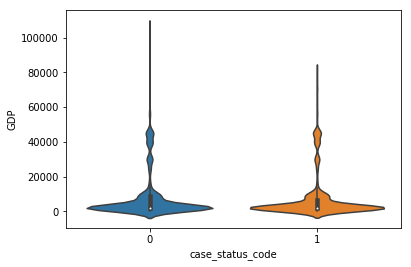

In [78]:
sns.violinplot(x="case_status_code", y="GDP", data=train)

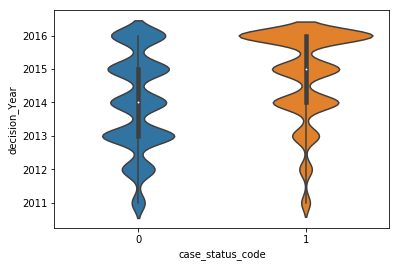

In [79]:
sns.violinplot(x="case_status_code", y="decision_Year", data=train)

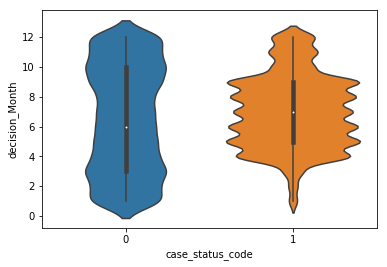

In [80]:
sns.violinplot(x="case_status_code", y="decision_Month", data=train)

Interestingly, we see that there is an increase in certified cases from 2015 to 2016. We will now plot stacked bar charts for the new variables and replot columns again in order to make final decision regarding features. 

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys


(0, 100)

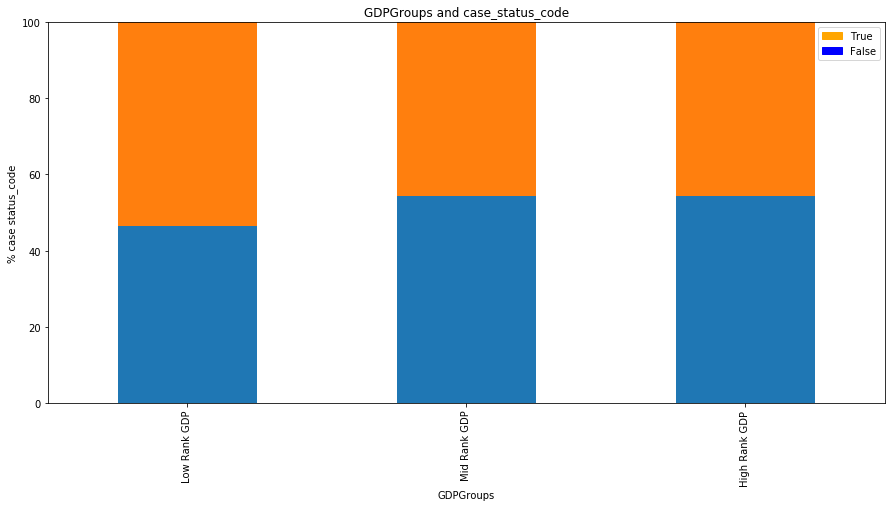

In [81]:
# GDPGroups                                                 
GDPGroups = pd.unique(train.GDPGroups.ravel())

train['percent'] = 0

for i in GDPGroups:
    count = 1 / train[train.GDPGroups== i].count()['GDPGroups']
    index_list = train[train['GDPGroups'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','GDPGroups','case_status_code']].groupby(['GDPGroups','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="GDPGroups and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("GDPGroups")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])



/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys
/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/matplotlib/transforms.py:436: RuntimeWarning: invalid value encountered in double_scalars
  return (x0, y0, x1 - x0, y1 - y0)


(0, 100)

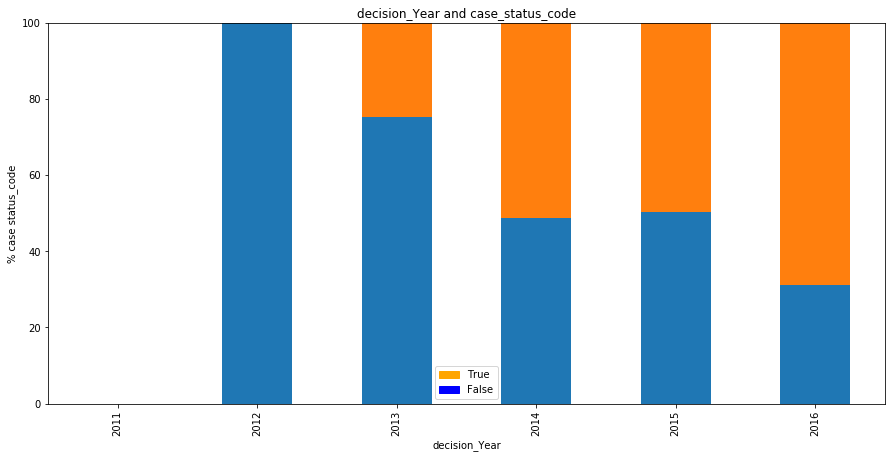

In [82]:
# Plotting decision_date also as it has low cardinality                                              
decision_Year = pd.unique(train.decision_Year.ravel())

train['percent'] = 0

for i in decision_Year:
    count = 1 / train[train.decision_Year== i].count()['GDPGroups']
    index_list = train[train['decision_Year'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','decision_Year','case_status_code']].groupby(['decision_Year','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="decision_Year and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("decision_Year")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])

(0, 100)

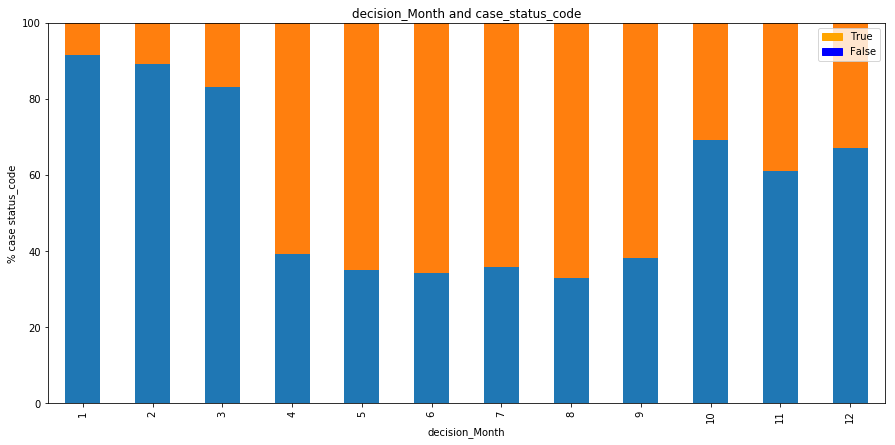

In [83]:
# wage_offer_unit_of_pay_9089                                                 
decision_Month= pd.unique(train.decision_Month.ravel())

train['percent'] = 0

for i in decision_Month:
    count = 1 / train[train.decision_Month== i].count()['decision_Month']
    index_list = train[train['decision_Month'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','decision_Month','case_status_code']].groupby(['decision_Month','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="decision_Month and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("decision_Month")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])


/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys


(0, 100)

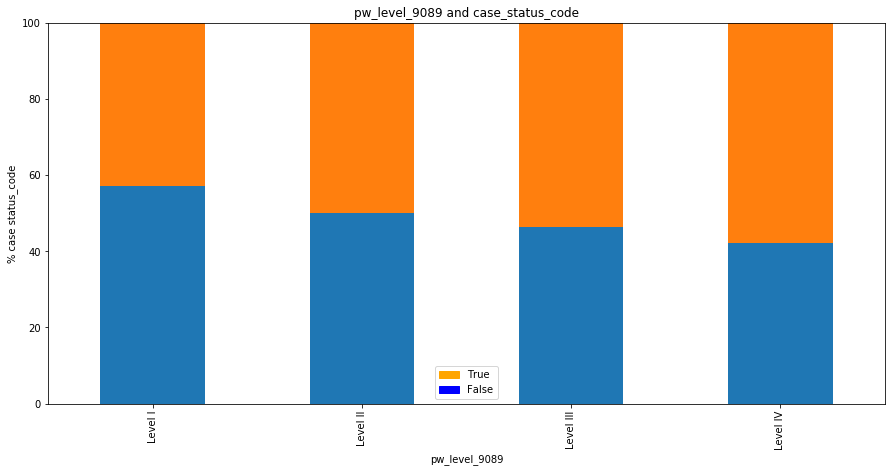

In [84]:
# pw_level_9089                                                 
pw_level_9089 = pd.unique(train.pw_level_9089.ravel())

train['percent'] = 0

for i in pw_level_9089:
    count = 1 / train[train.pw_level_9089== i].count()['pw_level_9089']
    index_list = train[train['pw_level_9089'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','pw_level_9089','case_status_code']].groupby(['pw_level_9089','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="pw_level_9089 and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("pw_level_9089")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])



/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys


(0, 100)

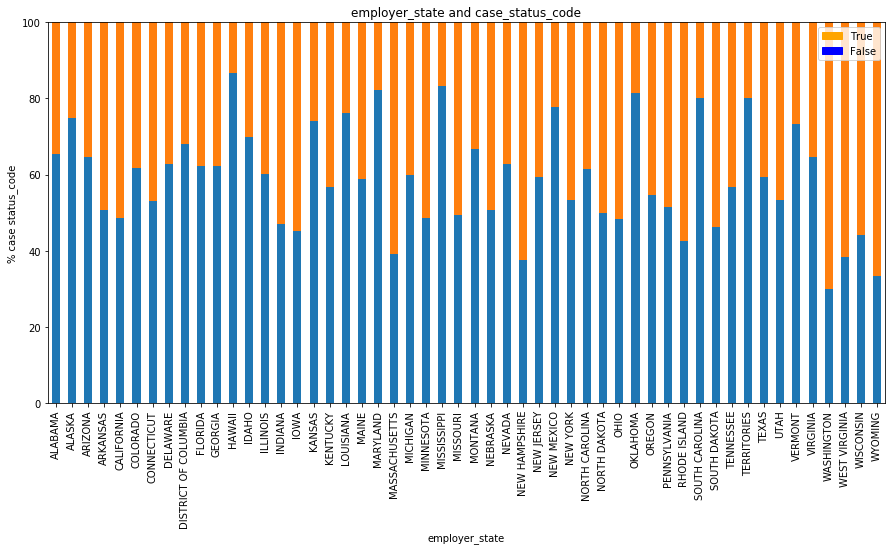

In [85]:
# employer_state                                           
employer_state = pd.unique(train.employer_state.ravel())

train['percent'] = 0

for i in employer_state:
    count = 1 / train[train.employer_state== i].count()['GDPGroups']
    index_list = train[train['employer_state'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','employer_state','case_status_code']].groupby(['employer_state','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="employer_state and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("employer_state")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys


(0, 100)

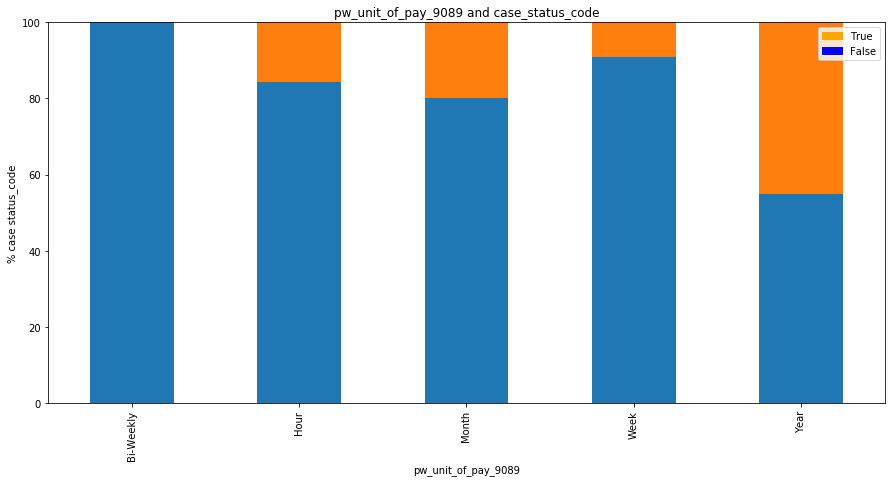

In [86]:
# pw_unit_of_pay_9089                                        
pw_unit_of_pay_9089 = pd.unique(train.pw_unit_of_pay_9089.ravel())

train['percent'] = 0

for i in pw_unit_of_pay_9089 :
    count = 1 / train[train.pw_unit_of_pay_9089== i].count()['GDPGroups']
    index_list = train[train['pw_unit_of_pay_9089'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','pw_unit_of_pay_9089','case_status_code']].groupby(['pw_unit_of_pay_9089','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="pw_unit_of_pay_9089 and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("pw_unit_of_pay_9089")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in long_scalars
  


(0, 100)

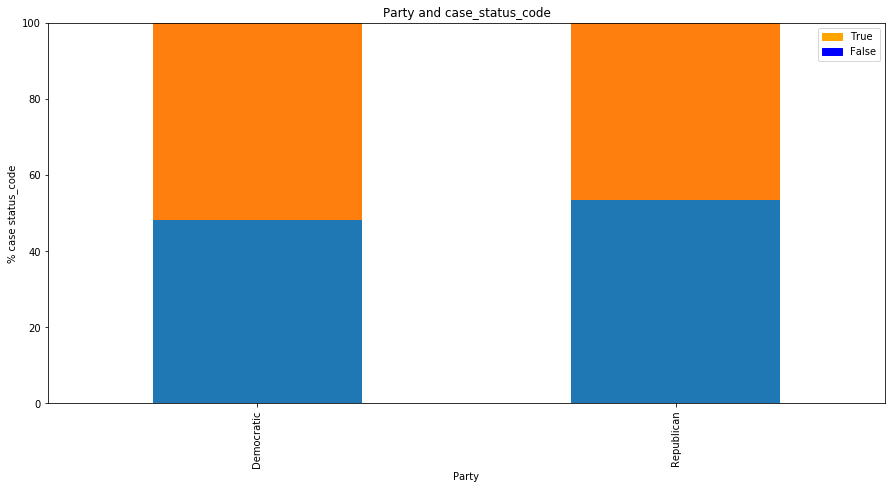

In [87]:
Party = pd.unique(train.Party.ravel())

train['percent'] = 0

for i in Party:
    count = 1 /train[train.Party== i].count()['Party']
    index_list = train[train['Party'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','Party','case_status_code']].groupby(['Party','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="Party and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("Party")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])

/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys


(0, 100)

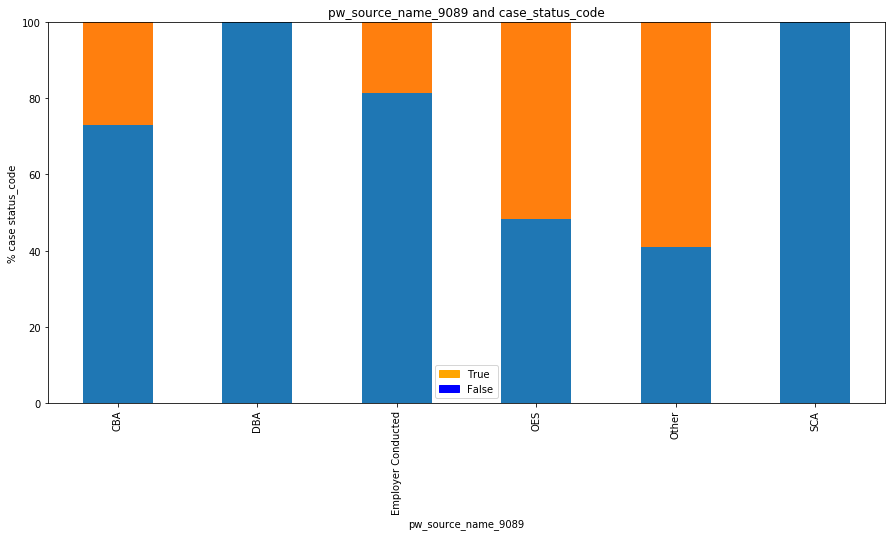

In [88]:
# pw_source_name_9089                                                 
pw_source_name_9089 = pd.unique(train.pw_source_name_9089.ravel())

train['percent'] = 0

for i in pw_source_name_9089:
    count = 1 / train[train.pw_source_name_9089== i].count()['pw_source_name_9089']
    index_list = train[train['pw_source_name_9089'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','pw_source_name_9089','case_status_code']].groupby(['pw_source_name_9089','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="pw_source_name_9089 and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("pw_source_name_9089")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])


/Users/Eimg/anaconda3/envs/comp47350/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in long_scalars
  


(0, 100)

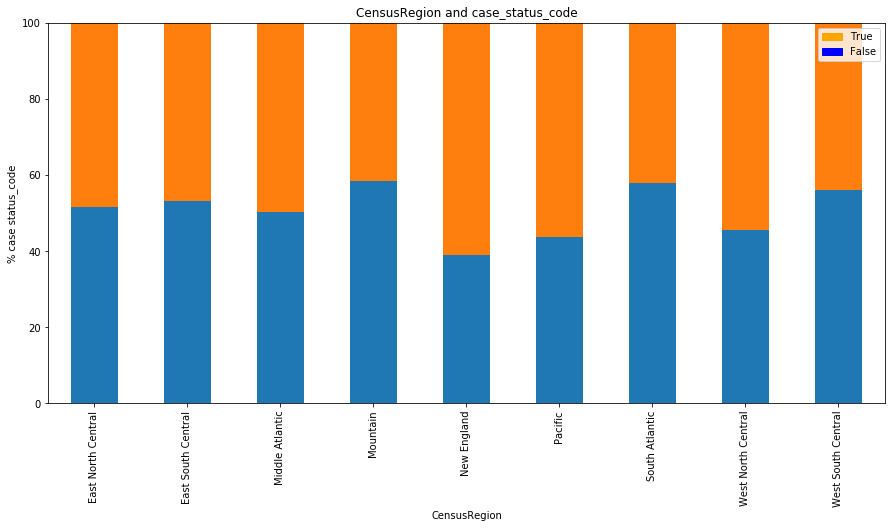

In [89]:
CensusRegion = pd.unique(train.CensusRegion.ravel())

train['percent'] = 0

for i in CensusRegion:
    count = 1 /train[train.CensusRegion== i].count()['CensusRegion']
    index_list = train[train['CensusRegion'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','CensusRegion','case_status_code']].groupby(['CensusRegion','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="CensusRegion and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("CensusRegion")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])

(0, 100)

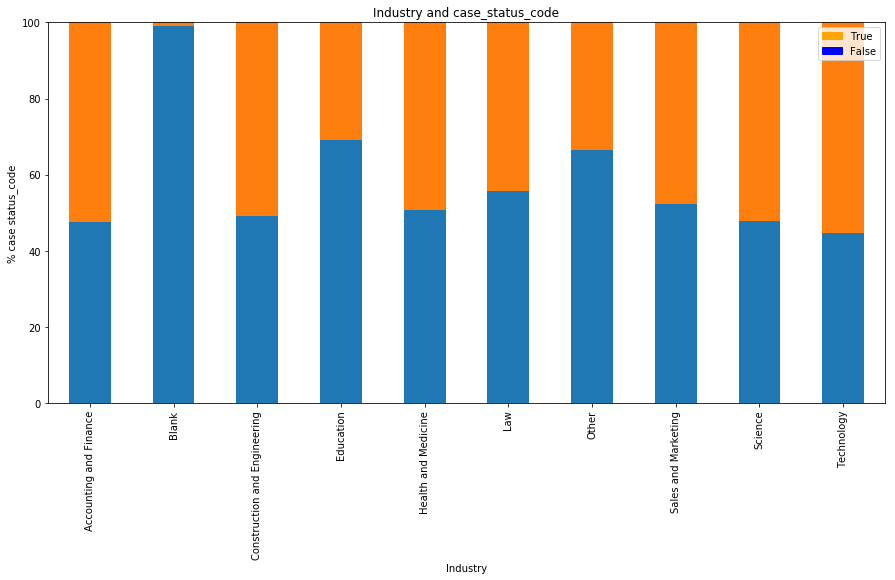

In [90]:
Industry = pd.unique(train.Industry.ravel())

train['percent'] = 0

for i in Industry:
    count = 1 /train[train.Industry== i].count()['Industry']
    index_list = train[train['Industry'] == i].index.tolist()
    for j in index_list:
        train.loc[j, 'percent'] = count * 100
        
group = train[['percent','Industry','case_status_code']].groupby(['Industry','case_status_code']).sum()

# Plot values of group in a stacked bar chart
my_plot = group.unstack().plot(kind='bar', stacked=True, title="Industry and case_status_code", figsize=(15,7))

# Define label colours and text and add to the plot
red_patch = mpatches.Patch(color='orange', label='True')
blue_patch = mpatches.Patch(color='blue', label='False')
my_plot.legend(handles=[red_patch, blue_patch], frameon = True)

# Define x and y labels and min and max values for the y axis
my_plot.set_xlabel("Industry")
my_plot.set_ylabel("% case status_code")
my_plot.set_ylim([0,100])

<h2>Feature Selection</h2>
<p>After plotting the newly created features and old existing features on the test data there were some interesting plots that showed some features may be a good indicator of whether a a candidate will become certified or denied.<p>
<p>The features decision year and decision month show that the timing of the decision is a strong indicator for whether an applicant is successful. In decision year, there is a strong trend indicating more sucessful candidates in recent years and in decision month it seems that candidates are more successful around spring and summer, than winter and autumn. These features seem to be key indicators. </p>
<p>There are also interesting features like employer region, a feature taken from employer state. This feature shows some variance between the regions, although the difference is not as large as employer state. We decided to select employer region as there are less categories to include in the model and this will ensure it is not overly complicated.</p>
<p>In relation to the wage level category the candidate will earn, level 1 is the lowest and level 4 is the highest.  There is a subtle trend that indicates the more a person earns the more likely they are to be accepted.<p>
<p>The unit of pay and source name show unusual trends in that in some categories nobody in certain areas will be accepted and some are split 50/50. These are different as the majority of the candidates all fall into one section in these categories and the others have far fewer people in them which may explain these plots. The unit of pay is how the candidate will be paid, if they are given a yearly salary it shows they are more likely to be accepted. Otherwise the chances of being certified are far less. This is a feature we decided to include but may need to evaluate as we only have a small sample of the data in our balanced trained set, so it may be need to be re-evaluated later due to the low number of candiates in other categories. It is a similar situation for source name, the source name is the data source for which the information for the wage level is obtained from. </p>
<p>Industry is the feature created from the job title, there is variance that shows people who are grouped within the 'other' or 'education' category are less likly to be accepted. Those who work within Science, Technology, Engineering and Maths (STEM) industries or within Law or Accounting generally have a 50/50 chance of being accepted, so it may not be as important a factor. The variance in some areas indicate that it may be an important feature and will be included in the model.</p>
<p>Our final selected features are:</p>
<ul><li>Decision Month - Possible strong indicator of case status</li>
<li>Decision Year - Possible strong indicator of case status</li>
<li>Census Region - Possible moderate indicator of case status</li>
<li>Industry- Possible moderate indicator of case status</li>
<li>Level - Possible modertate indicator of case status</li>
<li>Source Name - Possible weak indicator of case status</li>
<li>Unit of pay - Possible strong indicator of case status</li>

In [91]:
y = merged_final['case_status_code'].copy()

In [92]:
df_cont_feat = merged_final[['decision_Month', 'decision_Year']]
df_dummies_source = pd.get_dummies(merged_final[['pw_source_name_9089']])

X = pd.concat([df_cont_feat, df_dummies_source[['pw_source_name_9089_CBA', 'pw_source_name_9089_Employer Conducted','pw_source_name_9089_OES','pw_source_name_9089_Other','pw_source_name_9089_SCA']]], axis =1)

df_dummies_level = pd.get_dummies(merged_final[['pw_level_9089']])
X = pd.concat([X, df_dummies_level[['pw_level_9089_Level I', 'pw_level_9089_Level II','pw_level_9089_Level III','pw_level_9089_Level IV']]], axis =1)

df_dummies_pay = pd.get_dummies(merged_final[['pw_unit_of_pay_9089']])
X = pd.concat([X, df_dummies_pay[['pw_unit_of_pay_9089_Bi-Weekly', 'pw_unit_of_pay_9089_Hour','pw_unit_of_pay_9089_Month','pw_unit_of_pay_9089_Week','pw_unit_of_pay_9089_Year']]], axis =1)

df_dummies_region = pd.get_dummies(merged_final[['CensusRegion']])
X = pd.concat([X, df_dummies_region[['CensusRegion_East North Central', 'CensusRegion_East South Central','CensusRegion_West North Central','CensusRegion_West South Central','CensusRegion_South Atlantic','CensusRegion_Pacific','CensusRegion_Middle Atlantic','CensusRegion_Mountain','CensusRegion_New England']]], axis =1)

df_dummies_region = pd.get_dummies(merged_final[['Industry']])
X = pd.concat([X, df_dummies_region[['Industry_Science', 'Industry_Accounting and Finance','Industry_Construction and Engineering','Industry_Technology','Industry_Health and Medicine','Industry_Education','Industry_Other','Industry_Sales and Marketing','Industry_Law']]], axis =1)

<h2>Starting Decision Tree</h2>

In [93]:
dtc = DecisionTreeClassifier(max_depth=3, random_state=1)
dtc.fit(X, y)
print(dtc)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1,
            splitter='best')


In [94]:
type(dtc)

sklearn.tree.tree.DecisionTreeClassifier

In [95]:
pd.DataFrame({'feature': X.columns, 'importance': dtc.feature_importances_})

,feature,importance
0,decision_Month,0.575336
1,decision_Year,0.422772
2,pw_source_name_9089_CBA,0.000000
3,pw_source_name_9089_Employer Conducted,0.000000
4,pw_source_name_9089_OES,0.000000
5,pw_source_name_9089_Other,0.000000
6,pw_source_name_9089_SCA,0.000000
7,pw_level_9089_Level I,0.000000
8,pw_level_9089_Level II,0.000000
9,pw_level_9089_Level III,0.000000


In [96]:
predictions = dtc.predict(X)
df_true_vs_predicted = pd.DataFrame({'ActualClass': y, 'PredictedClass': predictions})
df_true_vs_predicted

,ActualClass,PredictedClass
49583,1,0
15015,1,1
37027,0,0
68750,1,1
124428,0,0
105430,0,0
71179,0,1
48832,0,1
98209,1,0
30668,0,1


In [97]:
print("Accuracy: ", metrics.accuracy_score(y, predictions))
print("Confusion matrix: \n", metrics.confusion_matrix(y, predictions))
print("Classification report:\n ", metrics.classification_report(y, predictions))

Accuracy:  0.705477537902606
Confusion matrix: 
 [[ 9802  4511]
 [ 3920 10393]]
Classification report:
               precision    recall  f1-score   support

          0       0.71      0.68      0.70     14313
          1       0.70      0.73      0.71     14313

avg / total       0.71      0.71      0.71     28626



<h1>Random Forest Model - Balanced Dataset</h1>

In [98]:
rfc = RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1)

In [99]:
rfc.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=1, verbose=0, warm_start=False)

In [100]:
pd.DataFrame({'feature': X.columns, 'importance':rfc.feature_importances_})

,feature,importance
0,decision_Month,0.464945
1,decision_Year,0.250675
2,pw_source_name_9089_CBA,0.003464
3,pw_source_name_9089_Employer Conducted,0.000549
4,pw_source_name_9089_OES,0.019822
5,pw_source_name_9089_Other,0.011619
6,pw_source_name_9089_SCA,0.000140
7,pw_level_9089_Level I,0.013975
8,pw_level_9089_Level II,0.014509
9,pw_level_9089_Level III,0.012076


In [101]:
rfc.predict_proba(X)

array([[0.17136412, 0.82863588],
       [0.        , 1.        ],
       [1.        , 0.        ],
       ...,
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.58480952, 0.41519048]])

In [102]:
rfc_predictions = rfc.predict(X)
df_true_vs_rfc_predicted = pd.DataFrame({'ActualClass': y, 'PredictedClass': rfc_predictions})
df_true_vs_rfc_predicted

,ActualClass,PredictedClass
49583,1,1
15015,1,1
37027,0,0
68750,1,1
124428,0,0
105430,0,0
71179,0,0
48832,0,0
98209,1,1
30668,0,1


In [103]:
print("Accuracy: ", metrics.accuracy_score(y, rfc_predictions))
print("Confusion matrix: \n", metrics.confusion_matrix(y, rfc_predictions))
print("Classification report:\n ", metrics.classification_report(y, rfc_predictions))

Accuracy:  0.8438482498428003
Confusion matrix: 
 [[11197  3116]
 [ 1354 12959]]
Classification report:
               precision    recall  f1-score   support

          0       0.89      0.78      0.83     14313
          1       0.81      0.91      0.85     14313

avg / total       0.85      0.84      0.84     28626



<p>The initial findings on the training data are quite good. The accuracy is good for a dataset that is 50:50 and there are high precision, recall and f1-score. This indicates that our model may be a good predictor of case status. </p>

In [104]:
#splitting the dataset into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

print("Training data:\n", pd.concat([X_train, y_train], axis=1))
print("\nTest data:\n", pd.concat([X_test, y_test], axis=1))

Training data:
         decision_Month  decision_Year  pw_source_name_9089_CBA  \
67832                5           2015                        0   
87203               11           2016                        0   
89632                3           2013                        0   
99271                5           2014                        0   
107028               7           2014                        0   
136127               4           2016                        0   
138679               7           2015                        0   
115804               7           2016                        0   
113912              11           2016                        0   
80169                7           2015                        0   
97475                2           2016                        0   
107103               4           2015                        0   
133226               8           2015                        0   
145368               4           2016                       

         decision_Month  decision_Year  pw_source_name_9089_CBA  \
57173               11           2016                        0   
74832                9           2013                        0   
17664                3           2013                        0   
75400                8           2016                        0   
13324                1           2016                        0   
128981              10           2016                        0   
149396               5           2016                        0   
83336                9           2014                        0   
139777               3           2016                        0   
4954                11           2016                        0   
117368               5           2014                        0   
18708                6           2014                        0   
29618                6           2013                        0   
59276               10           2013                        0   
125890   

<h1>Test Data</h1>

In [105]:
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=1, verbose=0, warm_start=False)

In [106]:
rfc_predictions_test = rfc.predict(X_test)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': y_test, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
57173,1,1
74832,0,1
17664,0,0
75400,1,0
13324,0,0
128981,1,1
149396,1,1
83336,1,1
139777,0,0
4954,1,1


In [107]:
print("Accuracy: ", metrics.accuracy_score(y_test, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(y_test, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(y_test, rfc_predictions_test))

Accuracy:  0.7660689333954355
Confusion matrix: 
 [[3071 1260]
 [ 749 3508]]
Classification report:
               precision    recall  f1-score   support

          0       0.80      0.71      0.75      4331
          1       0.74      0.82      0.78      4257

avg / total       0.77      0.77      0.77      8588



In [108]:
scores = cross_val_score(RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1), X, y, scoring='accuracy', cv=10)
print(scores)
print(scores.mean())

[0.75768156 0.75       0.75453911 0.77638015 0.7613557  0.76624738
 0.75821104 0.75227114 0.74703005 0.75786164]
0.758157776333306


In [109]:
scores = cross_val_score(RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1), X, y, scoring='f1', cv=10)
print(scores)
print(scores.mean())

[0.77452891 0.76416337 0.7646468  0.78779841 0.77466183 0.7798618
 0.76964048 0.7660838  0.7559002  0.77492692]
0.7712212530167726


In [110]:
scores = cross_val_score(RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1), X, y, scoring='recall', cv=10)
print(scores)
print(scores.mean())

[0.83240223 0.81005587 0.79748603 0.83018868 0.82040531 0.82809224
 0.80782669 0.81132075 0.78336827 0.83368274]
0.8154828830094983


In [111]:
rfc.oob_score_

0.7490767541670825

## Discussion
<p>There is a 10% drop between the training data and the test data, this may indicate that there was some inital overfitting of the model and that these results may be a more accurate representation. While these scores are important to show how the model is working on the balanced data, it is an unrealistic dataset and in most datasets the certified and denied ratio will be 90/10 not 50/50. For this reason we will use the model that has been trained on the balanced dataset and test it on the unbalanced data to ensure that we get the same accuracy in our results that we do on the balanced dataset.</p> 

## Unbalanced Data

In [112]:
y_unbal = merged_unbal['case_status_code'].copy()

In [113]:
df_cont_feat = merged_unbal[['decision_Month', 'decision_Year']]
df_dummies_source = pd.get_dummies(merged_unbal[['pw_source_name_9089']])

X_unbal = pd.concat([df_cont_feat, df_dummies_source[['pw_source_name_9089_CBA', 'pw_source_name_9089_Employer Conducted','pw_source_name_9089_OES','pw_source_name_9089_Other','pw_source_name_9089_SCA']]], axis =1)

df_dummies_level = pd.get_dummies(merged_unbal[['pw_level_9089']])
X_unbal = pd.concat([X_unbal, df_dummies_level[['pw_level_9089_Level I', 'pw_level_9089_Level II','pw_level_9089_Level III','pw_level_9089_Level IV']]], axis =1)

df_dummies_pay = pd.get_dummies(merged_unbal[['pw_unit_of_pay_9089']])
X_unbal = pd.concat([X_unbal, df_dummies_pay[['pw_unit_of_pay_9089_Bi-Weekly', 'pw_unit_of_pay_9089_Hour','pw_unit_of_pay_9089_Month','pw_unit_of_pay_9089_Week','pw_unit_of_pay_9089_Year']]], axis =1)

df_dummies_region = pd.get_dummies(merged_unbal[['CensusRegion']])
X_unbal = pd.concat([X_unbal, df_dummies_region[['CensusRegion_East North Central', 'CensusRegion_East South Central','CensusRegion_West North Central','CensusRegion_West South Central','CensusRegion_South Atlantic','CensusRegion_Pacific','CensusRegion_Middle Atlantic','CensusRegion_Mountain','CensusRegion_New England']]], axis =1)

df_dummies_region = pd.get_dummies(merged_unbal[['Industry']])
X_unbal = pd.concat([X_unbal, df_dummies_region[['Industry_Science', 'Industry_Accounting and Finance','Industry_Construction and Engineering','Industry_Technology','Industry_Health and Medicine','Industry_Education','Industry_Other','Industry_Sales and Marketing','Industry_Law']]], axis =1)
X_unbal.head()

,decision_Month,decision_Year,pw_source_name_9089_CBA,pw_source_name_9089_Employer Conducted,pw_source_name_9089_OES,pw_source_name_9089_Other,pw_source_name_9089_SCA,pw_level_9089_Level I,pw_level_9089_Level II,pw_level_9089_Level III,pw_level_9089_Level IV,pw_unit_of_pay_9089_Bi-Weekly,pw_unit_of_pay_9089_Hour,pw_unit_of_pay_9089_Month,pw_unit_of_pay_9089_Week,pw_unit_of_pay_9089_Year,CensusRegion_East North Central,CensusRegion_East South Central,CensusRegion_West North Central,CensusRegion_West South Central,CensusRegion_South Atlantic,CensusRegion_Pacific,CensusRegion_Middle Atlantic,CensusRegion_Mountain,CensusRegion_New England,Industry_Science,Industry_Accounting and Finance,Industry_Construction and Engineering,Industry_Technology,Industry_Health and Medicine,Industry_Education,Industry_Other,Industry_Sales and Marketing,Industry_Law
0,8,2014,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
1,4,2016,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,7,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,8,2013,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,6,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


In [114]:
unbalanced = pd.merge(merged_unbal, X_unbal, left_index=True, right_index=True)
unbalanced

,case_status,country_of_citizenship,decision_date,employer_name,employer_state,pw_level_9089,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,case_status_code,GDP,GDPGroups,country,advice,Party,Industry,decision_Year_x,decision_Month_x,CensusRegion,decision_Month_y,decision_Year_y,pw_source_name_9089_CBA,pw_source_name_9089_Employer Conducted,pw_source_name_9089_OES,pw_source_name_9089_Other,pw_source_name_9089_SCA,pw_level_9089_Level I,pw_level_9089_Level II,pw_level_9089_Level III,pw_level_9089_Level IV,pw_unit_of_pay_9089_Bi-Weekly,pw_unit_of_pay_9089_Hour,pw_unit_of_pay_9089_Month,pw_unit_of_pay_9089_Week,pw_unit_of_pay_9089_Year,CensusRegion_East North Central,CensusRegion_East South Central,CensusRegion_West North Central,CensusRegion_West South Central,CensusRegion_South Atlantic,CensusRegion_Pacific,CensusRegion_Middle Atlantic,CensusRegion_Mountain,CensusRegion_New England,Industry_Science,Industry_Accounting and Finance,Industry_Construction and Engineering,Industry_Technology,Industry_Health and Medicine,Industry_Education,Industry_Other,Industry_Sales and Marketing,Industry_Law
0,Certified,INDIA,2014-08-26,GREENBAY INFOTECH LLC,WASHINGTON,Level II,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2014,8,Pacific,8,2014,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
1,Certified,INDIA,2016-04-29,TANVI IT SOLUTIONS INC,VIRGINIA,Level III,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2016,4,South Atlantic,4,2016,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,Certified,COLOMBIA,2016-07-08,PAYLESS SHOESOURCE,KANSAS,Level I,"Transportation, Storage, and Distribution Mana...",OES,Year,1,6273.0,Mid Rank GDP,COLOMBIA,2: Exercise increased caution,Republican,Construction and Engineering,2016,7,West North Central,7,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,Certified,INDIA,2013-08-30,"SAI BUSINESS SOLUTIONS, LLC.",TEXAS,Level IV,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2013,8,West South Central,8,2013,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,Certified,CANADA,2016-06-22,THE PENNSYLVANIA STATE UNIVERSITY,PENNSYLVANIA,Level I,"Geography Teachers, Postsecondary",OES,Year,1,45077.0,High Rank GDP,CANADA,1: Exercise normal precautions,Republican,Education,2016,6,Middle Atlantic,6,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
5,Certified,INDIA,2016-06-23,TIBCO SOFTWARE INC.,CALIFORNIA,Level II,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2016,6,Pacific,6,2016,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,Certified,TAIWAN,2013-04-18,MARQUETTE UNIVERSITY,WISCONSIN,Level III,"Dentists, All Other Specialists",OES,Year,1,24577.0,High Rank GDP,TAIWAN,1: Exercise normal precautions,Republican,Health and Medicine,2013,4,East North Central,4,2013,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7,Certified,INDIA,2013-05-30,KPMG LLP,TEXAS,Level IV,Database Administrators,OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,2013,5,West South Central,5,2013,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
8,Certified,INDIA,2016-11-14,"THE CHILDREN'S PLACE SERVICES COMPANY, LLC",NEW JERSEY,Level II,Computer Systems Analysts,OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,2016,11,Middle Atlantic,11,2016,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0
9,Certified,CHINA,2016-09-02,"HERMES MICROVISION, INC.",CALIFORNIA,Level II,"Software Developers, Systems Software",OES,Year,1,8643.0,Mid Rank GDP,CHINA,2: Exercise increased caution,Democratic,Technology,2016,9,Pacific,9,2016,0,0,1,0,

In [115]:
del unbalanced['decision_Year_x']
del unbalanced['decision_Month_y']

In [116]:
unbalanced.rename(columns={'decision_Year_y':'decision_Year', 'decision_Month_x':'decision_Month'}, inplace=True)
unbalanced.head()

,case_status,country_of_citizenship,decision_date,employer_name,employer_state,pw_level_9089,pw_soc_title_x,pw_source_name_9089,pw_unit_of_pay_9089,case_status_code,GDP,GDPGroups,country,advice,Party,Industry,decision_Month,CensusRegion,decision_Year,pw_source_name_9089_CBA,pw_source_name_9089_Employer Conducted,pw_source_name_9089_OES,pw_source_name_9089_Other,pw_source_name_9089_SCA,pw_level_9089_Level I,pw_level_9089_Level II,pw_level_9089_Level III,pw_level_9089_Level IV,pw_unit_of_pay_9089_Bi-Weekly,pw_unit_of_pay_9089_Hour,pw_unit_of_pay_9089_Month,pw_unit_of_pay_9089_Week,pw_unit_of_pay_9089_Year,CensusRegion_East North Central,CensusRegion_East South Central,CensusRegion_West North Central,CensusRegion_West South Central,CensusRegion_South Atlantic,CensusRegion_Pacific,CensusRegion_Middle Atlantic,CensusRegion_Mountain,CensusRegion_New England,Industry_Science,Industry_Accounting and Finance,Industry_Construction and Engineering,Industry_Technology,Industry_Health and Medicine,Industry_Education,Industry_Other,Industry_Sales and Marketing,Industry_Law
0,Certified,INDIA,2014-08-26,GREENBAY INFOTECH LLC,WASHINGTON,Level II,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,8,Pacific,2014,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
1,Certified,INDIA,2016-04-29,TANVI IT SOLUTIONS INC,VIRGINIA,Level III,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Democratic,Technology,4,South Atlantic,2016,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,Certified,COLOMBIA,2016-07-08,PAYLESS SHOESOURCE,KANSAS,Level I,"Transportation, Storage, and Distribution Mana...",OES,Year,1,6273.0,Mid Rank GDP,COLOMBIA,2: Exercise increased caution,Republican,Construction and Engineering,7,West North Central,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,Certified,INDIA,2013-08-30,"SAI BUSINESS SOLUTIONS, LLC.",TEXAS,Level IV,"Software Developers, Applications",OES,Year,1,1983.0,Low Rank GDP,INDIA,2: Exercise increased caution,Republican,Technology,8,West South Central,2013,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,Certified,CANADA,2016-06-22,THE PENNSYLVANIA STATE UNIVERSITY,PENNSYLVANIA,Level I,"Geography Teachers, Postsecondary",OES,Year,1,45077.0,High Rank GDP,CANADA,1: Exercise normal precautions,Republican,Education,6,Middle Atlantic,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


In [117]:
rfc.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=1, verbose=0, warm_start=False)

In [118]:
rfc_predictions_test = rfc.predict(X_unbal)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': y_unbal, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
0,1,1
1,1,1
2,1,1
3,1,0
4,1,1
5,1,1
6,1,0
7,1,1
8,1,1
9,1,1


In [119]:
print("Accuracy: ", metrics.accuracy_score(y_unbal, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(y_unbal, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(y_unbal, rfc_predictions_test))

Accuracy:  0.820419853539463
Confusion matrix: 
 [[ 11197   3116]
 [ 24472 114840]]
Classification report:
               precision    recall  f1-score   support

          0       0.31      0.78      0.45     14313
          1       0.97      0.82      0.89    139312

avg / total       0.91      0.82      0.85    153625



In [120]:
rfc.oob_score_

0.7599035841542654

## Discussion
<p>The results on the unbalanced dataset are overall improved compared to the balanced dataset. Overall the accuracy, precision, recall and f1 have all gone up. The scores for predicting the negative outcome are less than that of the positive, this may show that our model is much better are predicting positive outcomes than negative. While the precision is quite low with the negative predictions, the recall value is not much lower than the positive prediction. In our model the recall value would be more beneficial to users than the precision value. </p>
<p>If the model predicts that someone will be accepted and they apply and are not, it is not as big a consequence if it predicts a user will not be accepted and they do not apply even though they would have been. The precision will affect individuals who will be told they will be accepted and are not, and the recall wll affect the individuals who are told they won't be accepted when they would have been. For this reason, while it is not ideal it is much better the model has a high recall and low precision than vice versa. </p>
<p>While the results look good, the unbalanced dataset has an acceptance rate of 91%, this means that if there was a model that predicted correct all the time it would have higher results than our model. While this model may be useful to determine applications that won't be accepted, there may be individuals missed in this model who would have been accepted but were given a no prediction. This means that we may have over simplified the data when creating new features, a new model may be created to try and get an accuracy over 90% to ensure that it would be more useful that a model that will just predict yes. </p>

<h2>Improving Model</h2>

<p>As random forest models work better with categorical data and as the month and year are dates, it would make sense to change these features to the category type to see whether this would affect the model's predictability.</p>

In [121]:
balanced['decision_Month'] = balanced['decision_Month'].astype('category')
balanced['decision_Year'] = balanced['decision_Year'].astype('category')

In [122]:
unbalanced.dtypes

case_status                                       object
country_of_citizenship                            object
decision_date                             datetime64[ns]
employer_name                                     object
employer_state                                    object
pw_level_9089                                     object
pw_soc_title_x                                    object
pw_source_name_9089                               object
pw_unit_of_pay_9089                               object
case_status_code                                   int64
GDP                                              float64
GDPGroups                                       category
country                                           object
advice                                            object
Party                                             object
Industry                                          object
decision_Month                                     int64
CensusRegion                   

In [123]:
df_dummies = pd.get_dummies(balanced[['decision_Month']])

X = pd.merge(X, df_dummies, left_index=True, right_index=True)

df_dummies = pd.get_dummies(balanced[['decision_Year']])
X = pd.merge(X, df_dummies, left_index=True, right_index=True)

In [124]:
del X['decision_Month']
del X['decision_Year']

In [125]:
X

,pw_source_name_9089_CBA,pw_source_name_9089_Employer Conducted,pw_source_name_9089_OES,pw_source_name_9089_Other,pw_source_name_9089_SCA,pw_level_9089_Level I,pw_level_9089_Level II,pw_level_9089_Level III,pw_level_9089_Level IV,pw_unit_of_pay_9089_Bi-Weekly,pw_unit_of_pay_9089_Hour,pw_unit_of_pay_9089_Month,pw_unit_of_pay_9089_Week,pw_unit_of_pay_9089_Year,CensusRegion_East North Central,CensusRegion_East South Central,CensusRegion_West North Central,CensusRegion_West South Central,CensusRegion_South Atlantic,CensusRegion_Pacific,CensusRegion_Middle Atlantic,CensusRegion_Mountain,CensusRegion_New England,Industry_Science,Industry_Accounting and Finance,Industry_Construction and Engineering,Industry_Technology,Industry_Health and Medicine,Industry_Education,Industry_Other,Industry_Sales and Marketing,Industry_Law,decision_Month_1,decision_Month_2,decision_Month_3,decision_Month_4,decision_Month_5,decision_Month_6,decision_Month_7,decision_Month_8,decision_Month_9,decision_Month_10,decision_Month_11,decision_Month_12,decision_Year_2011,decision_Year_2012,decision_Year_2013,decision_Year_2014,decision_Year_2015,decision_Year_2016
49583,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
15015,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
37027,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
68750,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
124428,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
105430,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
71179,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
48832,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
98209,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
30668,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


## Testing new model on balanced data

In [126]:
rfc.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=1, verbose=0, warm_start=False)

In [127]:
pd.DataFrame({'feature': X.columns, 'importance':rfc.feature_importances_})

,feature,importance
0,pw_source_name_9089_CBA,0.004315
1,pw_source_name_9089_Employer Conducted,0.000580
2,pw_source_name_9089_OES,0.020021
3,pw_source_name_9089_Other,0.011479
4,pw_source_name_9089_SCA,0.000168
5,pw_level_9089_Level I,0.022814
6,pw_level_9089_Level II,0.023902
7,pw_level_9089_Level III,0.019855
8,pw_level_9089_Level IV,0.021009
9,pw_unit_of_pay_9089_Bi-Weekly,0.000025


In [128]:
rfc_predictions = rfc.predict(X)
df_true_vs_rfc_predicted = pd.DataFrame({'ActualClass': y, 'PredictedClass': rfc_predictions})
df_true_vs_rfc_predicted

,ActualClass,PredictedClass
49583,1,1
15015,1,1
37027,0,0
68750,1,1
124428,0,0
105430,0,0
71179,0,0
48832,0,0
98209,1,1
30668,0,1


In [129]:
print("Accuracy: ", metrics.accuracy_score(y, rfc_predictions))
print("Confusion matrix: \n", metrics.confusion_matrix(y, rfc_predictions))
print("Classification report:\n ", metrics.classification_report(y, rfc_predictions))

Accuracy:  0.8438482498428003
Confusion matrix: 
 [[11173  3140]
 [ 1330 12983]]
Classification report:
               precision    recall  f1-score   support

          0       0.89      0.78      0.83     14313
          1       0.81      0.91      0.85     14313

avg / total       0.85      0.84      0.84     28626



<p>There are no improvements on the balanced dataset. </p>

## Testing new model on unbalanced data

In [130]:
unbalanced['decision_Month'] = unbalanced['decision_Month'].astype('category')
unbalanced['decision_Year'] = unbalanced['decision_Year'].astype('category')

In [131]:
df_dummies = pd.get_dummies(unbalanced[['decision_Month']])

X_unbal = pd.merge(X_unbal, df_dummies, left_index=True, right_index=True)

df_dummies = pd.get_dummies(unbalanced[['decision_Year']])
X_unbal = pd.merge(X_unbal, df_dummies, left_index=True, right_index=True)

In [132]:
X_unbal

,decision_Month,decision_Year,pw_source_name_9089_CBA,pw_source_name_9089_Employer Conducted,pw_source_name_9089_OES,pw_source_name_9089_Other,pw_source_name_9089_SCA,pw_level_9089_Level I,pw_level_9089_Level II,pw_level_9089_Level III,pw_level_9089_Level IV,pw_unit_of_pay_9089_Bi-Weekly,pw_unit_of_pay_9089_Hour,pw_unit_of_pay_9089_Month,pw_unit_of_pay_9089_Week,pw_unit_of_pay_9089_Year,CensusRegion_East North Central,CensusRegion_East South Central,CensusRegion_West North Central,CensusRegion_West South Central,CensusRegion_South Atlantic,CensusRegion_Pacific,CensusRegion_Middle Atlantic,CensusRegion_Mountain,CensusRegion_New England,Industry_Science,Industry_Accounting and Finance,Industry_Construction and Engineering,Industry_Technology,Industry_Health and Medicine,Industry_Education,Industry_Other,Industry_Sales and Marketing,Industry_Law,decision_Month_1,decision_Month_2,decision_Month_3,decision_Month_4,decision_Month_5,decision_Month_6,decision_Month_7,decision_Month_8,decision_Month_9,decision_Month_10,decision_Month_11,decision_Month_12,decision_Year_2011,decision_Year_2012,decision_Year_2013,decision_Year_2014,decision_Year_2015,decision_Year_2016
0,8,2014,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1,4,2016,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,7,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3,8,2013,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
4,6,2016,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
5,6,2016,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
6,4,2013,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,5,2013,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
8,11,2016,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
9,9,2016,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1


In [133]:
del X_unbal['decision_Month']
del X_unbal['decision_Year']

In [134]:
rfc_predictions_test = rfc.predict(X_unbal)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': y_unbal, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
0,1,1
1,1,1
2,1,1
3,1,0
4,1,1
5,1,1
6,1,0
7,1,1
8,1,1
9,1,1


In [135]:
print("Accuracy: ", metrics.accuracy_score(y_unbal, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(y_unbal, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(y_unbal, rfc_predictions_test))

Accuracy:  0.8263759153783564
Confusion matrix: 
 [[ 11173   3140]
 [ 23533 115779]]
Classification report:
               precision    recall  f1-score   support

          0       0.32      0.78      0.46     14313
          1       0.97      0.83      0.90    139312

avg / total       0.91      0.83      0.86    153625



<p>There are very minor imporvements on the unbalanced dataset, but this may have been picked up in the balanced as there was enough data to show as the improvements are so slight. The accuracy is up by 1% as is the average f1-score. These imporvements are not sufficent in creating a worthy model. </p>

### New features

<p>As previously mentioned there was data lost when creating the new features, especially when working with the state data. The census region data was used to reduce the amount of columns in the model, in an attempt not to over complicate it. This data loss may be significant and as the model is not producing the desired result the census region was removed and the state data replaced it. </p>

In [136]:
del X['CensusRegion_East North Central']
del X['CensusRegion_East South Central']
del X['CensusRegion_West North Central']
del X['CensusRegion_West South Central']
del X['CensusRegion_South Atlantic']
del X['CensusRegion_Pacific']
del X['CensusRegion_Middle Atlantic']
del X['CensusRegion_Mountain']
del X['CensusRegion_New England']

In [137]:
df_dummies = pd.get_dummies(balanced[['employer_state']])

X = pd.merge(X, df_dummies, left_index=True, right_index=True)

In [138]:
rfc.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=1, verbose=0, warm_start=False)

In [139]:
rfc_predictions_test = rfc.predict(X)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': y, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
49583,1,1
15015,1,1
37027,0,0
68750,1,1
124428,0,0
105430,0,0
71179,0,0
48832,0,0
98209,1,1
30668,0,1


In [140]:
print("Accuracy: ", metrics.accuracy_score(y, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(y, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(y, rfc_predictions_test))

Accuracy:  0.8763361978620834
Confusion matrix: 
 [[11851  2462]
 [ 1078 13235]]
Classification report:
               precision    recall  f1-score   support

          0       0.92      0.83      0.87     14313
          1       0.84      0.92      0.88     14313

avg / total       0.88      0.88      0.88     28626



<p>Improvements overall on the model, showing that the data lost when grouping was relevant and grouping may not have been the right option. </p>

### Testing new model on unbalanced data

In [141]:
del X_unbal['CensusRegion_East North Central']
del X_unbal['CensusRegion_East South Central']
del X_unbal['CensusRegion_West North Central']
del X_unbal['CensusRegion_West South Central']
del X_unbal['CensusRegion_South Atlantic']
del X_unbal['CensusRegion_Pacific']
del X_unbal['CensusRegion_Middle Atlantic']
del X_unbal['CensusRegion_Mountain']
del X_unbal['CensusRegion_New England']

In [142]:
df_dummies = pd.get_dummies(unbalanced[['employer_state']])

X_unbal = pd.merge(X_unbal, df_dummies, left_index=True, right_index=True)

In [143]:
X_unbal.head()

,pw_source_name_9089_CBA,pw_source_name_9089_Employer Conducted,pw_source_name_9089_OES,pw_source_name_9089_Other,pw_source_name_9089_SCA,pw_level_9089_Level I,pw_level_9089_Level II,pw_level_9089_Level III,pw_level_9089_Level IV,pw_unit_of_pay_9089_Bi-Weekly,pw_unit_of_pay_9089_Hour,pw_unit_of_pay_9089_Month,pw_unit_of_pay_9089_Week,pw_unit_of_pay_9089_Year,Industry_Science,Industry_Accounting and Finance,Industry_Construction and Engineering,Industry_Technology,Industry_Health and Medicine,Industry_Education,Industry_Other,Industry_Sales and Marketing,Industry_Law,decision_Month_1,decision_Month_2,decision_Month_3,decision_Month_4,decision_Month_5,decision_Month_6,decision_Month_7,decision_Month_8,decision_Month_9,decision_Month_10,decision_Month_11,decision_Month_12,decision_Year_2011,decision_Year_2012,decision_Year_2013,decision_Year_2014,decision_Year_2015,decision_Year_2016,employer_state_ALABAMA,employer_state_ALASKA,employer_state_ARIZONA,employer_state_ARKANSAS,employer_state_BRITISH COLUMBIA,employer_state_CALIFORNIA,employer_state_COLORADO,employer_state_CONNECTICUT,employer_state_DELAWARE,employer_state_DISTRICT OF COLUMBIA,employer_state_FLORIDA,employer_state_GEORGIA,employer_state_HAWAII,employer_state_IDAHO,employer_state_ILLINOIS,employer_state_INDIANA,employer_state_IOWA,employer_state_KANSAS,employer_state_KENTUCKY,employer_state_LOUISIANA,employer_state_MAINE,employer_state_MARYLAND,employer_state_MASSACHUSETTS,employer_state_MICHIGAN,employer_state_MINNESOTA,employer_state_MISSISSIPPI,employer_state_MISSOURI,employer_state_MONTANA,employer_state_NEBRASKA,employer_state_NEVADA,employer_state_NEW HAMPSHIRE,employer_state_NEW JERSEY,employer_state_NEW MEXICO,employer_state_NEW YORK,employer_state_NORTH CAROLINA,employer_state_NORTH DAKOTA,employer_state_OHIO,employer_state_OKLAHOMA,employer_state_OREGON,employer_state_PENNSYLVANIA,employer_state_RHODE ISLAND,employer_state_SOUTH CAROLINA,employer_state_SOUTH DAKOTA,employer_state_TENNESSEE,employer_state_TERRITORIES,employer_state_TEXAS,employer_state_UTAH,employer_state_VERMONT,employer_state_VIRGINIA,employer_state_WASHINGTON,employer_state_WEST VIRGINIA,employer_state_WISCONSIN,employer_state_WYOMING
0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [144]:
del X_unbal['employer_state_BRITISH COLUMBIA']

In [145]:
rfc_predictions_test = rfc.predict(X_unbal)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': y_unbal, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
0,1,1
1,1,1
2,1,1
3,1,0
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [146]:
print("Accuracy: ", metrics.accuracy_score(y_unbal, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(y_unbal, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(y_unbal, rfc_predictions_test))

Accuracy:  0.8309324654190399
Confusion matrix: 
 [[ 11851   2462]
 [ 23511 115801]]
Classification report:
               precision    recall  f1-score   support

          0       0.34      0.83      0.48     14313
          1       0.98      0.83      0.90    139312

avg / total       0.92      0.83      0.86    153625



<p>The accuracy in this model is still too low to be considered useful in the unbalanced dataset, while it may be useful if the data set had more negative outcomes, but for this particular set we would need an accuracy of over 90%. </p>

<p>In attempt to create a more accurate model, a new model will be created using the unbalanced dataset. </p>

### Creating a model from the unbalanced data

In [147]:
X_unbal.shape

(153625, 93)

In [148]:
test = X_unbal[:46087]
train = X_unbal[46087:]
testy = y_unbal[:46087]
trainy = y_unbal[46087:]

In [149]:
rfc.fit(train, trainy)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=1, verbose=0, warm_start=False)

In [150]:
rfc_predictions_test = rfc.predict(train)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': trainy, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
46087,1,1
46088,1,1
46089,1,1
46090,1,1
46091,1,1
46092,1,1
46093,1,1
46094,1,1
46095,1,1
46096,1,1


In [151]:
print("Accuracy: ", metrics.accuracy_score(trainy, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(trainy, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(trainy, rfc_predictions_test))

Accuracy:  0.9586099797280961
Confusion matrix: 
 [[ 5807  4208]
 [  243 97280]]
Classification report:
               precision    recall  f1-score   support

          0       0.96      0.58      0.72     10015
          1       0.96      1.00      0.98     97523

avg / total       0.96      0.96      0.95    107538



<h2>Testing</h2>

In [152]:
rfc_predictions_test = rfc.predict(test)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': testy, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [153]:
print("Accuracy: ", metrics.accuracy_score(testy, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(testy, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(testy, rfc_predictions_test))

Accuracy:  0.9456679757849284
Confusion matrix: 
 [[ 2099  2199]
 [  305 41484]]
Classification report:
               precision    recall  f1-score   support

          0       0.87      0.49      0.63      4298
          1       0.95      0.99      0.97     41789

avg / total       0.94      0.95      0.94     46087



In [154]:
scores = cross_val_score(RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1), X_unbal, y_unbal, scoring='accuracy', cv=10)
print(scores)
print(scores.mean())

[0.94487113 0.94474095 0.94760138 0.94447338 0.94479885 0.94603567
 0.94395261 0.94590548 0.94629606 0.94766306]
0.9456338574043723


In [155]:
scores = cross_val_score(RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1), X_unbal, y_unbal, scoring='f1', cv=10)
print(scores)
print(scores.mean())

[0.97030883 0.97020112 0.9717276  0.97009012 0.9702769  0.9709235
 0.96981172 0.97084313 0.97104552 0.97178155]
0.9707009986700393


In [156]:
scores = cross_val_score(RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1), X_unbal, y_unbal, scoring='recall', cv=10)
print(scores)
print(scores.mean())

[0.9933965  0.99203273 0.99303711 0.99296533 0.99353959 0.99353959
 0.99274998 0.99310889 0.99303711 0.99375494]
0.9931161766619219


### Testing unbalanced model on balanced dataset

In [157]:
rfc_predictions_test = rfc.predict(X)
df_true_vs_rfc_predicted_test = pd.DataFrame({'ActualClass': y, 'PredictedClass': rfc_predictions_test})
df_true_vs_rfc_predicted_test

,ActualClass,PredictedClass
49583,1,1
15015,1,1
37027,0,0
68750,1,1
124428,0,0
105430,0,0
71179,0,1
48832,0,0
98209,1,1
30668,0,1


In [158]:
print("Accuracy: ", metrics.accuracy_score(y, rfc_predictions_test))
print("Confusion matrix: \n", metrics.confusion_matrix(y, rfc_predictions_test))
print("Classification report:\n ", metrics.classification_report(y, rfc_predictions_test))

Accuracy:  0.7741214280723817
Confusion matrix: 
 [[ 7906  6407]
 [   59 14254]]
Classification report:
               precision    recall  f1-score   support

          0       0.99      0.55      0.71     14313
          1       0.69      1.00      0.82     14313

avg / total       0.84      0.77      0.76     28626



### Discussion
<p>As we can see from the above results, the model that is trained on the unbalanced dataset is giving more accurate predictions than that of the balanced dataset. This would be expected as most of the values in the unbalanced dataset are positive, so the model would have a bias when deciding true or positive resulting in mostly positive results. We can see from the confusion matrix the model is not as accurate at predicting negative results, with a very low recall value. As previously discussed recall would be an important score in our model.</p>
<p>To ensure that the model would work on a more balanced dataset we tested the unbalanced model on the balanced dataset. The results we got were also an improvement on the balanced model. The accuracy went up by 2%, and there is an overall increase in precision, recall and f1 score. This may indicate that for this purpose the unbalanced model may be a better indicator of whether or not an applicant is likely to be successful. The low recall value in these models may be an issue for users, as previously discussed there are more consequences for an application that has a predicted no, which would have been a yes, than the opposite. This is affected by the recall and while the overall recall is high, the recall for negative predictions is low. These low negative values are masked in the unbalanced cross validation as there are not many negative values, which is why it was important to test on the balanced dataset.</p>
<p>Although it may not be best practice to have models trained on the unbalanced dataset, it is showing to have more accurate and precise results. The low recall value would be an issue and is something that would need to be improved upon if the model were to be implemented in reality.</p>
<p>The model trained on the unbalanced dataset has shown to be of more use than a model that would predict yes for 90% of the values, and may have a useful implementation and impact if it were to be used.</p>

In [159]:
# creating the requirements.txt file
! pip freeze > requirements.txt

You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


# Deployment

With changing political and economic climates in the US ongoing we expected to see a degree of oncept drifting that will in future affect the results of the above trained models.
We understand that it is important that we put in place an on-going model validation scheme to monitor the model to catch the point at which it begins to go stale. However, in the case of predicting visa outcomes where it can takes weeks / months for the predicted outcome to become available this approach simply will not work. 

### Speed or cost of collecting features:
Majority of the features used in our models were created from a combination of original features selected and binned from the original data. To make this model viable in the realworld we would need to have a way to quickly assign these new features. 

### Interpretability / Quality of results :
When training our models, as can be seen above we were extremely conscious of the fact that the dataset we were using was very unbalanced. It was highlighted to us that although we can balanced the data and use the balanced dataset to train the model, the predictions may not reflect the real world results. 
The model we have developed is performing around 5% better than a model that would predict certified all the time but the margin for improvement from our original model was 10% in total. 

### Are there any issues regarding using the analytics solution in practice?
In terms of the deployment of the model, we found from analysing the data that 91% of the total applicants were certified. There was no strong indicator of certain criteria needed for an applicant to be accepted or denied. The strongest indicator was the month / year. This correlated with the visa application opening in April and the limit per country saw them decline in likelihood of acceptance when visa's began to run out. It seems that if an applicant was to have all the required fields of the application filled and submit on time there would be a higher likelihood of their certification to work in this US.